## Laboratorio 2: Análisis exploratorio en un problema de clasificación

### Utilizaremos en esta práctica las siguientes librerías
[numpy](http://www.numpy.org/) permite manipular matrices de modo sencillo e incorpora funciones de cálculo útiles.  
[pandas](http://pandas.pydata.org/) proporciona estructuras de datos fáciles de usar y funciones de acceso a datos desde múltiples fuentes y formatos.  
[matplotlib](matplotlib.org) permite generar múltiples tipos de gráficos.  
[re](https://docs.python.org/2/library/re.html#) permite manipular expresiones regulares.

In [1]:
%matplotlib inline
import re
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
import brewer2mpl
from matplotlib import rcParams

#colorbrewer2 Dark2 qualitative color table
dark2_cmap = brewer2mpl.get_map('Dark2', 'Qualitative', 7)
dark2_colors = dark2_cmap.mpl_colors

rcParams['figure.figsize'] = (10, 6)
rcParams['figure.dpi'] = 150
rcParams['lines.linewidth'] = 2
rcParams['axes.facecolor'] = 'white'
rcParams['font.size'] = 14
rcParams['patch.edgecolor'] = 'white'
rcParams['patch.facecolor'] = dark2_colors[0]
rcParams['font.family'] = 'StixGeneral'


# Para eliminar bordes en gráficas

def elimina_borde(axes=None, top=False, right=False, left=True, bottom=True):
    ax = axes or plt.gca()
    ax.spines['top'].set_visible(top)
    ax.spines['right'].set_visible(right)
    ax.spines['left'].set_visible(left)
    ax.spines['bottom'].set_visible(bottom)
    
    # Eliminar marcas
    ax.yaxis.set_ticks_position('none')
    ax.xaxis.set_ticks_position('none')
    
    # Rehabilitar visibles
    if top:
        ax.xaxis.tick_top()
    if bottom:
        ax.xaxis.tick_bottom()
    if left:
        ax.yaxis.tick_left()
    if right:
        ax.yaxis.tick_right()

In [3]:
pd.set_option('display.width', 500)
pd.set_option('display.max_columns', 100)

## Clasificación de aceites de oliva italianos

El punto de partida es una colección de datos extraídos de un conjunto de diferentes aceites de oliva. Cada muestra de aceite se representa mediante ocho parámetros, que se corresponden con los niveles de distintos ácidos grasos en cada aceite. Cada muestra de aceite pertenece a una de entre nueve variedades de aceite de oliva, de tres regiones y ocho áreas geográficas distintas de Italia. El objetivo del análisis es desarrollar un conjunto de reglas de clasificación que permitan distinguir de modo fiable los nueve aceites. Este es un problema de interés práctico, porque el aceite de algunas de las zonas está muy bien valorado, y existe cierto nivel de fraude en la denominación de origen. Además, el contenido en ácidos grasos varía con el clima, lo que resulta relevante para decidir qué variedades se han de plantar en según qué zonas. 

** Fuente: **  
Forina, M., Armanino, C., Lanteri, S. & Tiscornia, E. (1983), Classification of Olive Oils from their Fatty Acid Composition, in Martens, H. and
Russwurm Jr., H., eds, Food Research and Data Analysis, Applied Science
Publishers, London, pp. 189–214.

Número de muestras: 572

Número de variables: 10

*Descripción:* Los datos representan el porcentaje (x100) de ácidos grasos en la fracción lipídica de un conjunto de muestras de aceites de oliva procedentes de Italia. Los datos proceden de un estudio cuyo objetivo es la determinación de la autenticidad de la denominación de origen en el aceite de oliva.

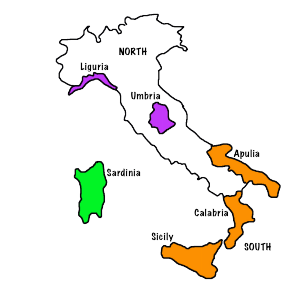

In [4]:
from IPython.display import Image
Image(filename='Italy.png')

## 1. Cargamos y limpiamos los datos
Cargamos los datos desde el fichero oliva.csv mediante las librerías pandas y visualizamos al menos las 5 primeras filas de datos. Como el fichero está en formato csv buscamos la existencia de alguna función en pandas de nombre `read_csv()`.

In [5]:
#almacenamos los datos del fichero en el objeto 'datos', de tipo Dataframe

datos=pd.read_csv("oliva.csv")

datos.head()

,Unnamed: 0,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,1.Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
1,2.Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
2,3.Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
3,4.Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
4,5.Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46


Pondremos nombre a la primera columna, que carece de él. Para ello podemos consultar la existencia de alguna función en pandas de nombre `rename()`.

In [6]:
datos.rename(columns = {'Unnamed: 0':'Procedencia'}, inplace = True)

#se divide la columna "Procedencia" por el símbolo "." y se obtienen como resultado 2 columnas, una conserva el nombre de "Procedencia" y la otra, de nombre "#", contiene el número de cada observación
datos[['#','Procedencia']] = datos.Procedencia.str.split(".",expand=True) 

#se elimina la columna que contiene el número de observación
datos=datos.drop(columns=['#']) 

datos.head()

,Procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
1,Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
2,Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
3,Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
4,Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46


Queremos acceder a la subtabla formada por las columnas `oleico` y `linoleico`.

In [7]:
oleico_linoleico = datos[['oleico', 'linoleico']]
oleico_linoleico.head()

,oleico,linoleico
0,7823,672
1,7709,781
2,8113,549
3,7952,619
4,7771,672


El resultado es un nuevo objeto, del tipo `DataFrame` de pandas. Queremos ahora acceder a una sola de las columnas, por ejemplo, la del ácido esteárico.

In [8]:
estearico = datos['esteárico']
estearico.head()

0    226
1    224
2    246
3    240
4    259
Name: esteárico, dtype: int64

El objeto obtenido es un objeto del tipo `Series` de pandas. Si utilizamos dos corchetes para indexar a partir de una lista obtendremos un objeto de tipo Dataframe. Analizaremos los tipos de ambos ejemplos mediante la función `type()`.

In [9]:
print ("tipo de datos[[u'esteárico']]:\t", type(datos[[u'esteárico']]))
print ("tipo de datos[u'esteárico']:\t", type(datos[u'esteárico']))

tipo de datos[[u'esteárico']]:	 <class 'pandas.core.frame.DataFrame'>
tipo de datos[u'esteárico']:	 <class 'pandas.core.series.Series'>


Si los nombres no tienen acentos podemos acceder a cada columna de una manera más sencilla, por ejemplo, mediante `datos.estearico`.

Resulta un poco confusa la existencia de una columna región y otra área, además de la que nombra la procedencia. Consultaremos qué valores distintos hay en ambas columnas. En este caso es sencillo porque el conjunto de datos no es muy extenso, pero utilizaremos la función `unique()` para hacer este análisis extensivo a cualquier conjunto de datos verdaderamente grande.

In [10]:
datos['región'].unique()

array([1, 2, 3], dtype=int64)

In [11]:
datos['área'].unique()

array([1, 2, 3, 4, 5, 6, 9, 7, 8], dtype=int64)

Necesitamos saber cuántas zonas únicas hay en el conjunto de datos, ya que a ellas asignaremos cada etiqueta de clase. Para ello podemos realizar una tabla de contingencia entre las etiquetas de regiones y las etiquetas de áreas. En python podemos hacer esto mediante la función `crosstab()`.

In [12]:
pd.crosstab(datos['región'],datos['área'])

área,1,2,3,4,5,6,7,8,9
región,,,,,,,,,
1,25,56,206,36,0,0,0,0,0
2,0,0,0,0,65,33,0,0,0
3,0,0,0,0,0,0,50,50,51


Generamos el conjunto de valores diferentes de la columna procedencia mediante la función `unique()`

In [13]:
datos['Procedencia'].unique()

array(['Puglia-Nord', 'Calabria', 'Puglia-Sud', 'Sicilia',
       'Sardinia-Interno', 'Sardinia-Costa', 'Umbria', 'Liguria-Est',
       'Liguria-Ovest'], dtype=object)

Recuperaremos los valores originales (en tanto por ciento) de la proporción de cada ácido graso en cada muestra de aceite, porque después su representación gráfica será más fácilmente comprensible. Para ello actuamos sobre las columnas que representan las proporciones de los ácidos grasos. Podemos utilizar la función `apply()` para dividir todos los valores entre 100.

In [14]:
# Definimos una lista con los nombres de los distintos ácidos
acidos = list(datos.columns[3:])

# Accedemos a cada uno de los valores de cada una de las columnas y lo dividimos entre 100 mediante apply()
for acido in acidos:
    datos[acido]=datos[acido].apply(lambda x: x/100)
    
datos.head()

,Procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,Puglia-Nord,1,1,10.75,0.75,2.26,78.23,6.72,0.36,0.60,0.29
1,Puglia-Nord,1,1,10.88,0.73,2.24,77.09,7.81,0.31,0.61,0.29
2,Puglia-Nord,1,1,9.11,0.54,2.46,81.13,5.49,0.31,0.63,0.29
3,Puglia-Nord,1,1,9.66,0.57,2.40,79.52,6.19,0.50,0.78,0.35
4,Puglia-Nord,1,1,10.51,0.67,2.59,77.71,6.72,0.50,0.80,0.46


Podemos comprobar que la composición de ácidos grasos es consistente, es decir, que la suma de las proporciones de los ácidos grasos para cada muestra se mantiene próximo al 100%.

In [15]:
datos['suma'] = datos[acidos[0]] + datos[acidos[1]] + datos[acidos[2]] + datos[acidos[3]] + datos[acidos[4]] + datos[acidos[5]] + datos[acidos[6]] +  datos[acidos[7]]                
datos.head()

,Procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico,suma
0,Puglia-Nord,1,1,10.75,0.75,2.26,78.23,6.72,0.36,0.60,0.29,99.96
1,Puglia-Nord,1,1,10.88,0.73,2.24,77.09,7.81,0.31,0.61,0.29,99.96
2,Puglia-Nord,1,1,9.11,0.54,2.46,81.13,5.49,0.31,0.63,0.29,99.96
3,Puglia-Nord,1,1,9.66,0.57,2.40,79.52,6.19,0.50,0.78,0.35,99.97
4,Puglia-Nord,1,1,10.51,0.67,2.59,77.71,6.72,0.50,0.80,0.46,99.96


In [16]:
#añadimos un breve análisis estadítico de la columna 'suma' y verificamos que los valores están centrados en 100 con una desviación estandar pequeña
datos['suma'].describe()

count    572.000000
mean      99.852448
std        0.268201
min       98.110000
25%       99.700000
50%       99.960000
75%      100.010000
max      101.020000
Name: suma, dtype: float64

In [17]:
#eliminamos la columna 'suma'
datos=datos.drop(columns=['suma'])

Representamos mediante gráficos de dispersión los datos correspondientes a la presencia de ácido palmítico y ácido palmitoleico en el total de las muestras. Las librerías pyplot utilizan la noción de figura actual y ejes actuales. Para realizar esta figura podemos hacer uso de la función `scatter()`. También podemos utilizar las funciones `set_title()`, `set_xlabel()` y `set_ylabel()` para añadir rótulos a la figura a partir del objeto que representa los ejes, que podemos extraer mediante la función `gca()`.

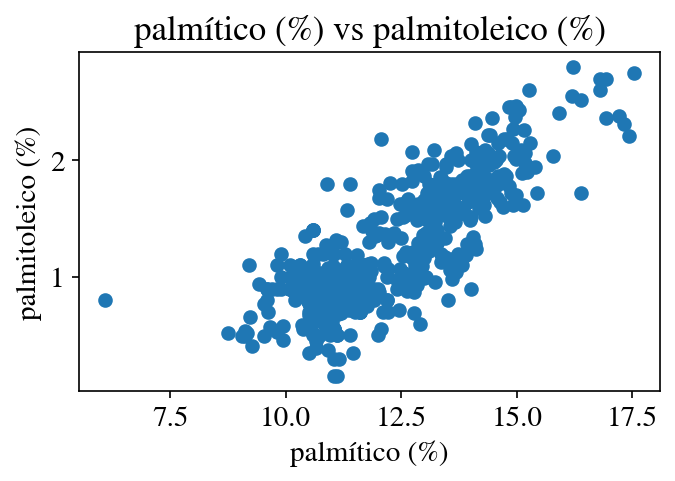

In [18]:
# Definimos la figura actual
fig=plt.figure(figsize=(5,3))
plt.scatter(datos['palmítico'],datos['palmitoleico'] )

# Definimos los ejes actuales
ax = fig.gca()

# Introducimos título de la figura y de los ejes a partir del objeto axis
ax.set_title(u'palmítico (%) vs palmitoleico (%)')
ax.set_xlabel(u'palmítico (%)')
ax.set_ylabel(u'palmitoleico (%)')

plt.show()

Representamos gráficamente el histograma de la presencia de ácido palmitoleico en el conjunto de muestras. Hacemos uso para ello de la función `hist()`.

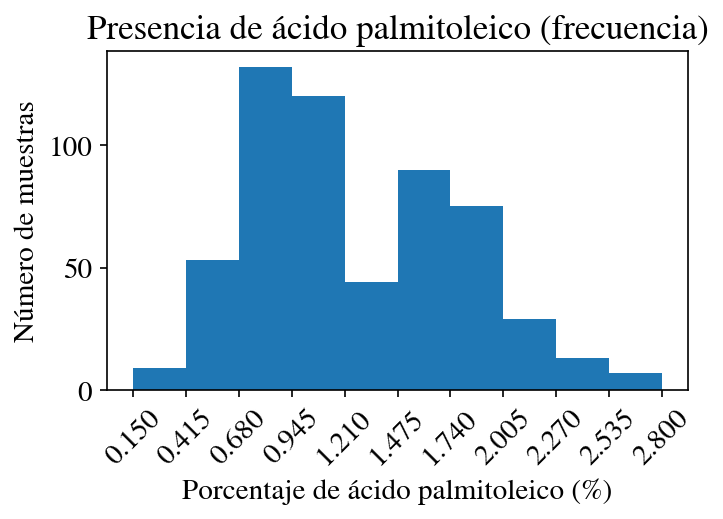

In [19]:
# Definimos la figura actual
fig=plt.figure(figsize=(5,3))
n, bins, edges = plt.hist(datos.palmitoleico, bins=10)

# Definimos los ejes actuales
ax = fig.gca()

# Introducimos título de la figura y de los ejes a partir del objeto axis
ax.set_title(u'Presencia de ácido palmitoleico (frecuencia)')
ax.set_xlabel(u'Porcentaje de ácido palmitoleico (%)')
ax.set_ylabel(u'Número de muestras')
plt.xticks(bins, rotation=45)



plt.show()

Utilizaremos la función `subplots()` para representar cuatro figuras en una matriz de dos por dos.

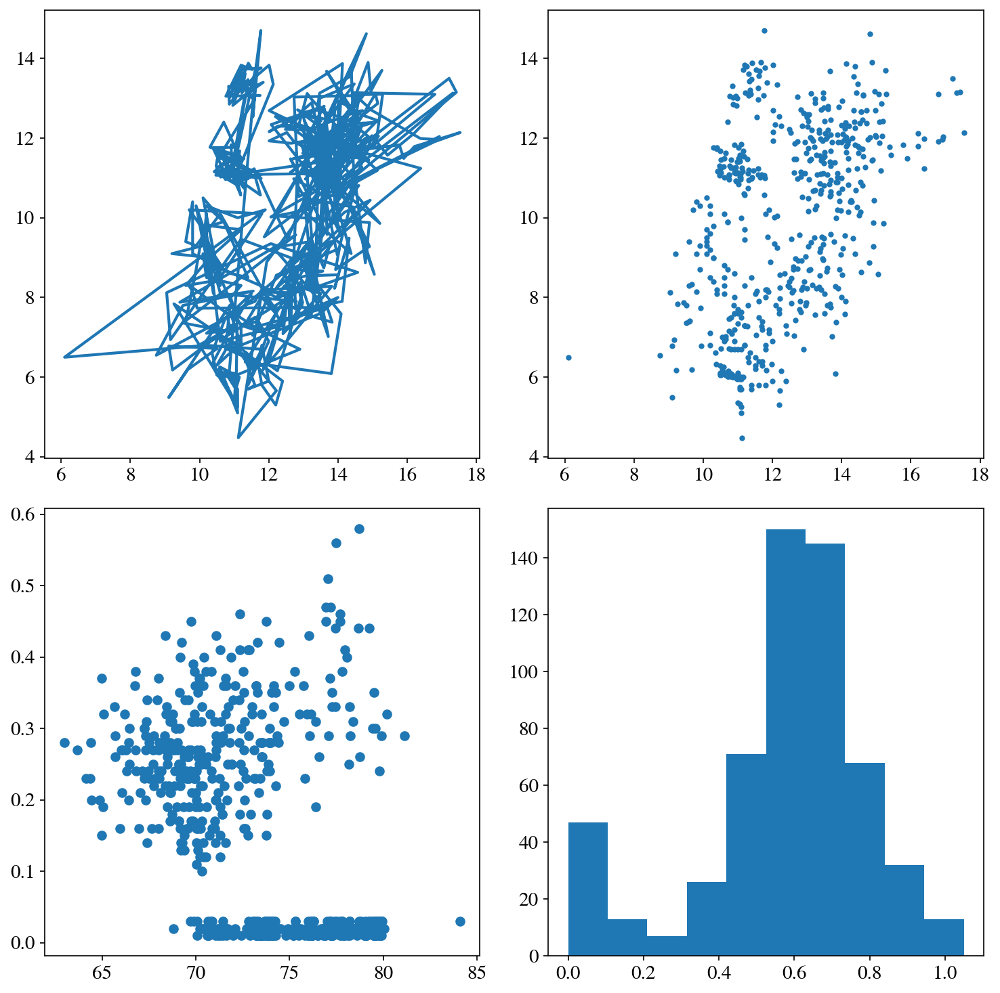

In [20]:
fig, axes=plt.subplots(figsize=(10,10), nrows=2, ncols=2)
axes[0][0].plot(datos[u'palmítico'], datos['linoleico'])
axes[0][1].plot(datos[u'palmítico'], datos['linoleico'], '.')
axes[1][0].scatter(datos['oleico'],datos['eicosenoico'])
axes[1][1].hist(datos[u'araquídico'])
fig.tight_layout()

Representaremos mediante gráficos de dispersión los ácidos grasos de la lista `acidos_y` frente a los de la lista `acidos_x`. Podemos dibujar los ácidos grasos de la lista `acidos_y`en el eje 'y' y los ácidos grasos de la lista `acidos_x` en el eje 'x'. La representación se hará mediante una matriz de figuras de 3 filas y 2 columnas. Etiquetar convenientemente cada figura. Para no contar el número de elementos en las listas, podemos utilizar la función `enumerate()`.

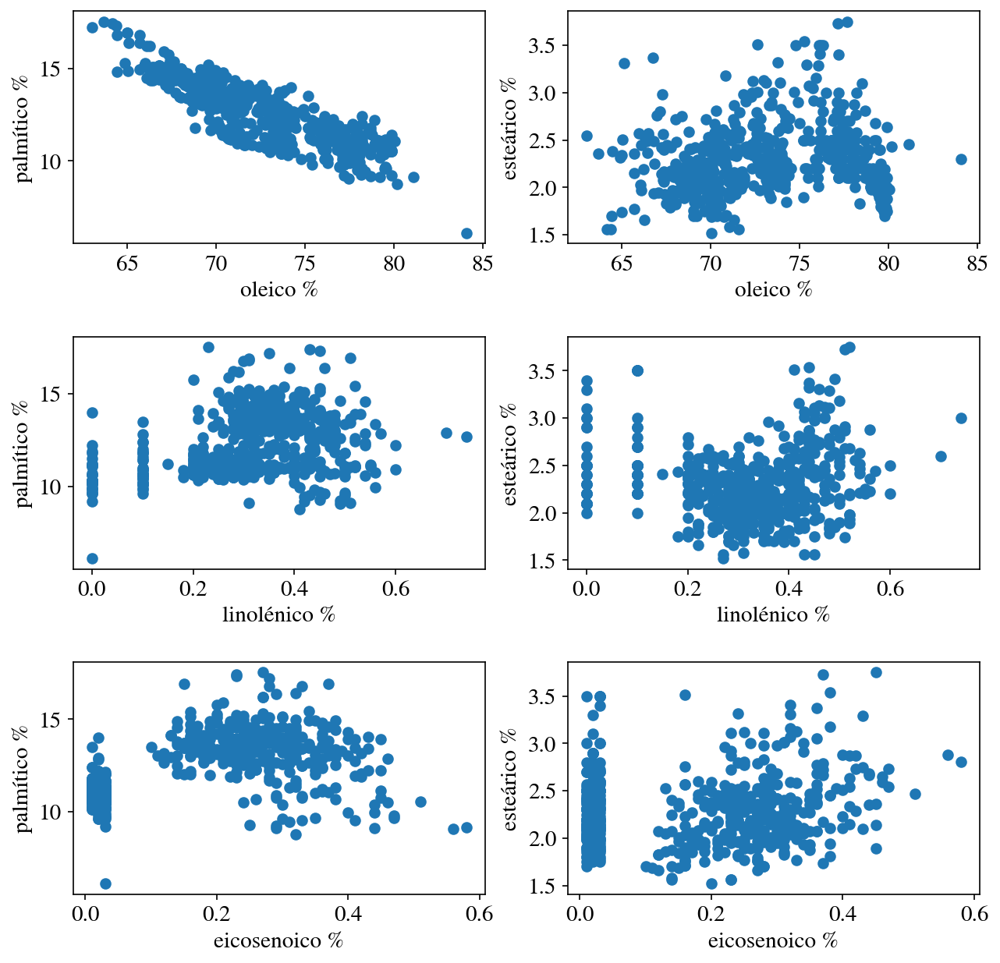

In [21]:
acidos_x=[u'oleico',u'linolénico',u'eicosenoico']
acidos_y=[u'palmítico',u'esteárico']

# Utilizaremos dos bucles recorriendo la lista de acidos_x y acidos_y
fig, axes=plt.subplots(figsize=(10,10), nrows=len(acidos_x), ncols=len(acidos_y))

for x, acido_x in enumerate(acidos_x):
    for y, acido_y in enumerate(acidos_y):
        axes[x][y].scatter(datos[acido_x], datos[acido_y])
        
for i, row in enumerate(axes):
    for j, cell in enumerate(row):
        cell.set_xlabel(f"{acidos_x[i]} %")
        cell.set_ylabel(f"{acidos_y[j]} %")

plt.subplots_adjust(hspace=0.4, wspace=0.2)

Utilizaremos la función `groupby()` para realizar distintos agrupamientos de los valores de la tabla. En primer lugar, agruparemos por el valor la columna `región`, que nos permitirá dividir el conjunto de datos en tres subconjuntos.

In [22]:
objeto_region = datos.groupby(by="región")

La función `groupby()` proporciona un objeto de tipo diccionario, donde las claves son los valores que permiten el agrupamiento, y los grupos direccionados por las claves son los correspondientes subconjuntos de la matriz inicial. Podemos direccionar los tres subconjuntos correspondientes a las tres regiones iterando mediante un bucle.

In [23]:
diccionario_regiones = {}

for clave,valor in objeto_region:
    diccionario_regiones[clave] = valor    
diccionario_regiones[1]

,Procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,Puglia-Nord,1,1,10.75,0.75,2.26,78.23,6.72,0.36,0.60,0.29
1,Puglia-Nord,1,1,10.88,0.73,2.24,77.09,7.81,0.31,0.61,0.29
2,Puglia-Nord,1,1,9.11,0.54,2.46,81.13,5.49,0.31,0.63,0.29
3,Puglia-Nord,1,1,9.66,0.57,2.40,79.52,6.19,0.50,0.78,0.35
4,Puglia-Nord,1,1,10.51,0.67,2.59,77.71,6.72,0.50,0.80,0.46
...,...,...,...,...,...,...,...,...,...,...,...
318,Puglia-Sud,1,3,16.38,2.52,2.15,65.70,11.99,0.39,0.53,0.29
319,Puglia-Sud,1,3,14.97,2.47,2.19,66.21,12.70,0.36,0.73,0.32
320,Puglia-Sud,1,3,14.42,2.22,1.94,66.77,13.14,0.36,0.72,0.38
321,Puglia-Sud,1,3,16.80,2.70,1.70,64.40,13.10,0.31,0.62,0.28


Como vemos, la función `groupby()` no solo realiza un agrupamiento visual, sino que identifica cada uno de los grupos como objetos en sí mismos del tipo `DataFrame`, sobre los que podemos operar. Por ejemplo, podemos utilizar la función `describe()` para analizar cada una de las regiones de un modo inmediato.

In [24]:
#Región 1
diccionario_regiones[1].describe()

,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
count,323.0,323.000000,323.000000,323.000000,323.000000,323.000000,323.000000,323.000000,323.000000,323.000000
mean,1.0,2.783282,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220
std,0.0,0.741054,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
min,1.0,1.000000,8.750000,0.350000,1.520000,63.000000,4.480000,0.200000,0.320000,0.100000
25%,1.0,2.500000,12.680000,1.215000,2.015000,68.830000,8.555000,0.320000,0.560000,0.220000
50%,1.0,3.000000,13.460000,1.630000,2.230000,70.300000,10.900000,0.370000,0.620000,0.270000
75%,1.0,3.000000,14.190000,1.850000,2.495000,72.835000,12.025000,0.440000,0.690000,0.320000
max,1.0,4.000000,17.530000,2.800000,3.750000,81.130000,14.620000,0.740000,1.020000,0.580000


In [25]:
#Región 2
diccionario_regiones[2].describe()

,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
count,98.0,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000
mean,2.0,5.336735,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388
std,0.0,0.475023,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
min,2.0,5.000000,10.300000,0.350000,1.990000,68.820000,10.570000,0.150000,0.450000,0.010000
25%,2.0,5.000000,10.852500,0.882500,2.120000,71.372500,11.122500,0.230000,0.660000,0.010000
50%,2.0,5.000000,11.075000,0.960000,2.220000,73.255000,11.465000,0.270000,0.720000,0.020000
75%,2.0,6.000000,11.372500,1.040000,2.395000,73.810000,13.065000,0.300000,0.810000,0.020000
max,2.0,6.000000,12.130000,1.350000,2.720000,74.390000,14.700000,0.430000,1.050000,0.030000


In [26]:
#Región 3
diccionario_regiones[3].describe()

,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
count,151.0,151.000000,151.000000,151.000000,151.000000,151.000000,151.000000,151.000000,151.000000,151.000000
mean,3.0,8.006623,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735
std,0.0,0.820542,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298
min,3.0,7.000000,6.100000,0.150000,1.700000,73.400000,5.100000,0.000000,0.000000,0.010000
25%,3.0,7.000000,10.600000,0.690000,2.000000,76.800000,6.020000,0.100000,0.100000,0.010000
50%,3.0,8.000000,10.900000,0.800000,2.300000,78.000000,6.800000,0.200000,0.380000,0.020000
75%,3.0,9.000000,11.250000,1.000000,2.500000,79.500000,8.250000,0.350000,0.595000,0.025000
max,3.0,9.000000,14.000000,1.800000,3.500000,84.100000,10.500000,0.700000,1.000000,0.030000


Un ejemplo de lo que podemos hacer es iterar sobre el conjunto de series de valores para cada columna en cada región, y calcular la desviación estándar mediante la función `std()`. Observa el tipo del resultado como conjunto de desviaciones estándar para cada columna.

In [27]:
for clave, valor in objeto_region:
    print (f'Región: {clave}')
    for columna in valor.columns[3:-1]:
        print (f'Ácido {columna}: {valor[columna].std()}')
    print("\n")

Región: 1
Ácido palmítico: 1.5293487249947033
Ácido palmitoleico: 0.5072368573630378
Ácido esteárico: 0.3987085135053064
Ácido oleico: 3.4514306589921704
Ácido linoleico: 2.1067301758699712
Ácido linolénico: 0.07972708626393828
Ácido araquídico: 0.11164430181553035


Región: 2
Ácido palmítico: 0.4041105851528897
Ácido palmitoleico: 0.13851429063561724
Ácido esteárico: 0.17636271749206697
Ácido oleico: 1.4187826781499056
Ácido linoleico: 1.0723355415029274
Ácido linolénico: 0.0538437360013708
Ácido araquídico: 0.11882609236705931


Región: 3
Ácido palmítico: 0.8256351251148414
Ácido palmitoleico: 0.2643878514272922
Ácido esteárico: 0.3895604700472053
Ácido oleico: 1.6481552467650893
Ácido linoleico: 1.431225776374244
Ácido linolénico: 0.16886526886455241
Ácido araquídico: 0.2935857332730202




Además, pandas permite reunir los resultados de ejecutar `std()` en un nuevo objeto del tipo `DataFrame`. Y lo hace él todo. Podemos simplemente aplicar la función `std()` sobre el resultado del agrupamiento realizado mediante `groupby()`.

In [28]:
#Std
datos_std = objeto_region.std()

datos_std

,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
región,,,,,,,,,
1,0.741054,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
2,0.475023,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
3,0.820542,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298


Podemos utilizar la función `agreggate()` para aplicar distintas funciones de cálculo a los datos del nuevo objeto, por ejemplo `np.sum()` `np.mean()`. La aplicación de estas funciones se realiza columna a columna. 

In [29]:
#Sum
objeto_region.aggregate(np.sum)

,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
región,,,,,,,,,
1,899,4303.29,500.01,738.94,22933.03,3338.20,122.95,203.87,88.25
2,523,1089.12,94.81,221.66,7122.66,1172.60,26.55,71.71,1.90
3,1209,1653.15,126.44,348.51,11767.51,1097.82,32.90,56.74,2.98


In [30]:
#Mean
datos_mean = objeto_region.aggregate(np.mean)

datos_mean

,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
región,,,,,,,,,
1,2.783282,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220
2,5.336735,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388
3,8.006623,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735


In [31]:
#Count
datos_count = pd.DataFrame(objeto_region.apply(lambda x: len(x)))

datos_count

,0
región,
1,323
2,98
3,151


**Se observa que las regiones presentan distinta cantidad de muestras**

In [32]:
objeto_region.aggregate(lambda x: x.mean()) 
# ¿Qué estamos haciendo?

,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
región,,,,,,,,,
1,2.783282,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220
2,5.336735,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388
3,8.006623,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735


También podemos utilizar la función `apply()` para aplicar una función determinada al nuevo objeto. Por ejemplo, podemos volver a realizar la media sobre los valores de las columnas de cada una de las regiones. Aunque pueden coincidir en algunos resultados, la función `apply()` opera sobre cada grupo, mientras que `aggregate()` opera sobre cada una de las columnas.

In [33]:
#Apply mean
objeto_region.apply(np.mean) 

,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
región,,,,,,,,,
1,2.783282,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220
2,5.336735,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388
3,8.006623,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735


Renombraremos las columnas de la tabla datos_std para añadir después de cada nombre la extensión '`_std`'. Para ello podemos iterar sobre todas las cadenas de `acidos`, añadiendo la subcadena `_std` después de cada cadena. Esto se puede hacer mediante una sencilla estructura diccionario en la que hacemos corresponder a cada cadena de ácidos una nueva cadena en la que añadimos '`_std`'. La función a utilizar es `rename()` donde haremos `inplace = True` para hacer la sustitución sobre la misma estructura de datos, y no sobre una copia.

In [34]:
for acido in acidos:
    datos_std.rename(columns = {f'{acido}': f'{acido}_std'}, inplace = True)
    datos_mean.rename(columns = {f'{acido}': f'{acido}_mean'}, inplace = True) #repetiremos lo mismo para el dataframe "datos_mean"
    
datos_std

,área,palmítico_std,palmitoleico_std,esteárico_std,oleico_std,linoleico_std,linolénico_std,araquídico_std,eicosenoico_std
región,,,,,,,,,
1,0.741054,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
2,0.475023,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
3,0.820542,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298


In [35]:
datos_mean

,área,palmítico_mean,palmitoleico_mean,esteárico_mean,oleico_mean,linoleico_mean,linolénico_mean,araquídico_mean,eicosenoico_mean
región,,,,,,,,,
1,2.783282,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220
2,5.336735,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388
3,8.006623,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735


Haremos una sencilla operación de unión entre tablas para disponer de una nueva tabla en la que representamos la media y la desviación estándar para el ácido oleico en cada una de las tres regiones. Para ello extraemos dos estructuras dataframe a partir de `datos_mean` y `datos_std` para la columna de interés. Después utilizamos la función `join()` para unir ambas estructuras.

In [36]:
#objeto DataFrame conteniendo la información de los valores medios del contenido de ácido oleico en los olivos de las distintas regiones
datos_mean_oleico = datos_mean[['oleico_mean']]

#objeto DataFrame conteniendo la información de las desviaciones estándar del contenido de ácido oleico en los olivos de las distintas regiones
datos_std_oleico = datos_std[['oleico_std']]

datos_mean_y_std = datos_mean_oleico.join(datos_std_oleico)

datos_mean_y_std

,oleico_mean,oleico_std
región,,
1,71.000093,3.451431
2,72.680204,1.418783
3,77.930530,1.648155


## 2. Análisis exploratorio de datos en una dimensión

In [37]:
clave_region=[1,2,3]
valor_region=['Sud','Sardinia','Nord']
dict_region={e[0]:e[1] for e in zip(clave_region,valor_region)}
dict_region

{1: 'Sud', 2: 'Sardinia', 3: 'Nord'}

Vamos a volver sobre la tabla en la que representábamos los valores medios de cada ácido graso en cada región. En esa tabla aparecían también los valores medios del área, lo que es un tanto anómalo. Extraeremos una nueva tabla en la que sólo aparecerán los valores medios correspondientes a ácidos grasos.

In [38]:
datos_mean_correcto = datos_mean.drop(columns=['área'])
datos_mean_correcto

,palmítico_mean,palmitoleico_mean,esteárico_mean,oleico_mean,linoleico_mean,linolénico_mean,araquídico_mean,eicosenoico_mean
región,,,,,,,,
1,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220
2,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388
3,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735


Realizaremos un gráfico de barras con los porcentajes relativos de ácidos grasos. Podemos utilizar la opción kind='barh'. En el gráfico llamaremos a la región 1 'Sud', a la 2 'Sardinia' y a la 3 'Nord', de acuerdo con el mapa inicialmente proporcionado.

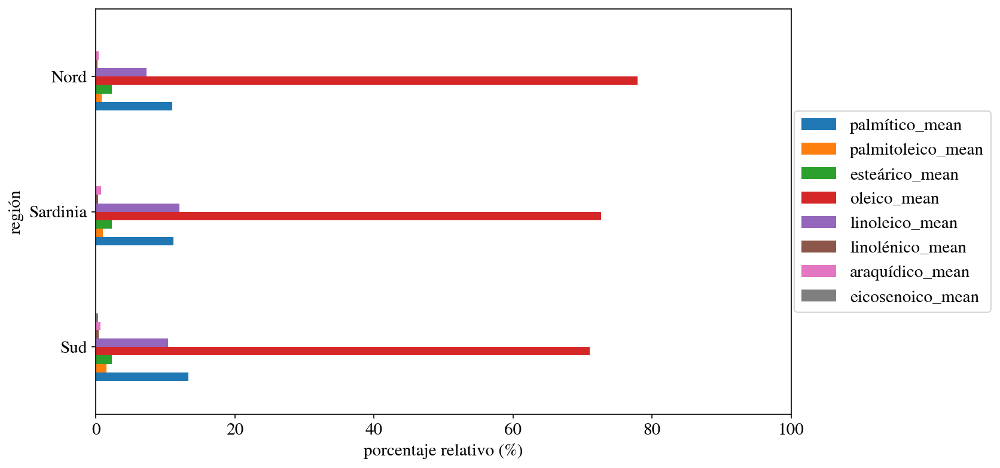

In [39]:
ax = datos_mean_correcto.plot(kind = 'barh')
# Para sacar fuera de la gráfica la leyenda y facilitar la inspección
ax.legend(loc='right',bbox_to_anchor=(1.3,0.5))
ax.set_xlim([0,100])
ax.set_yticklabels(list(dict_region.values()))
ax.set_xlabel('porcentaje relativo (%)')

plt.show()

**Se observa que en las 3 regiones los ácidos de mayor preponderancia son: el oleico, el palmítico y el linoleico.** 

Hemos representado las proporciones de ácidos grasos en cada región. Representaremos ahora para cada ácido graso, su distribución por regiones. Para ello, en primer lugar podemos dividir una figura en tantas subfiguras como ácidos grasos, mediante la función `subplots()`. Un lazo nos permitirá recorrer cada una de las subfiguras, y en cada una de ellas representaremos tres histogramas, cada uno de ellos representando el histograma del correspondiente ácido graso en una de las tres regiones.

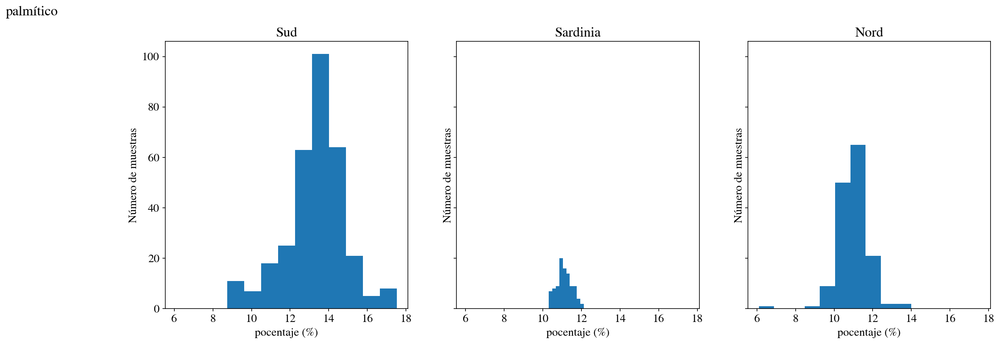

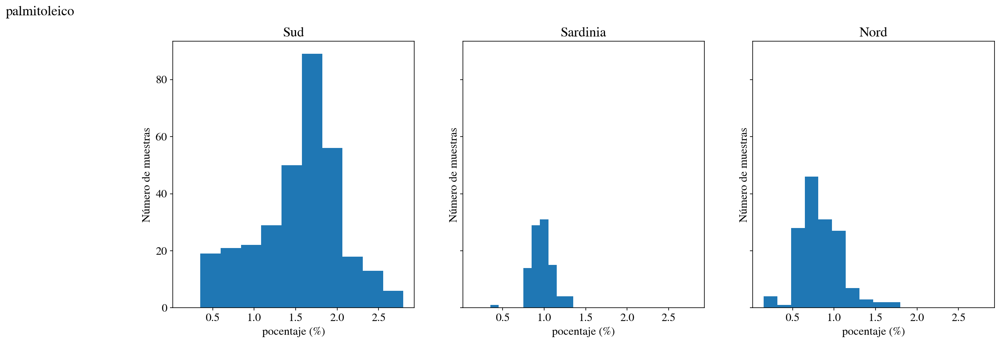

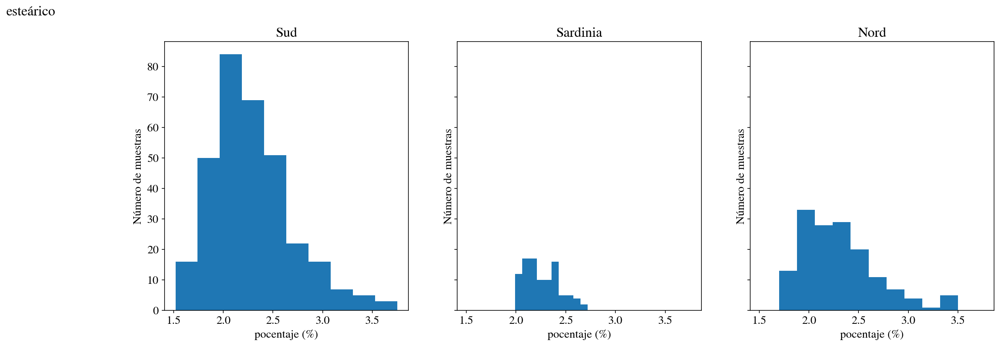

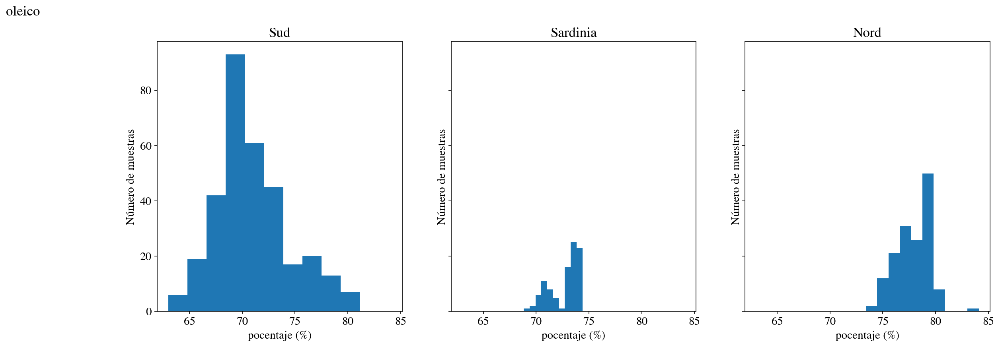

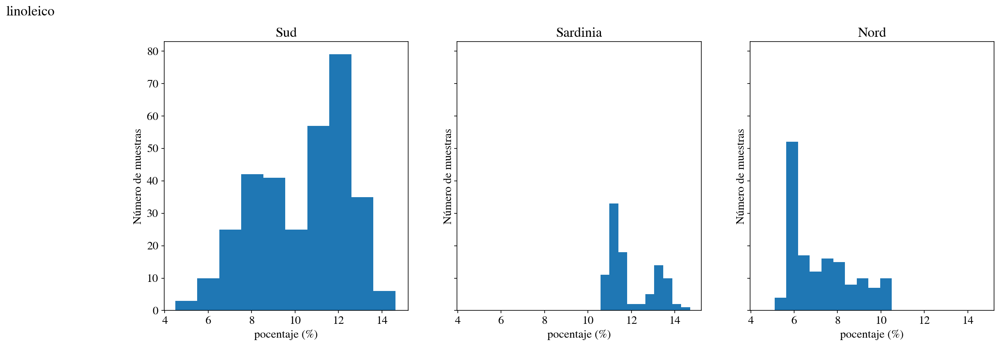

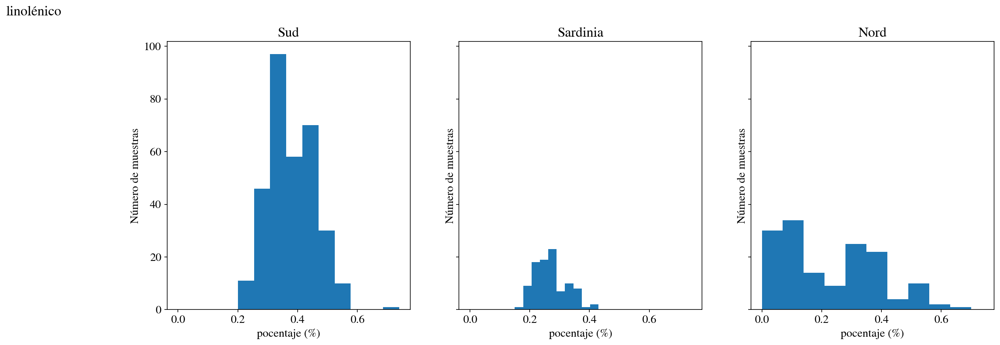

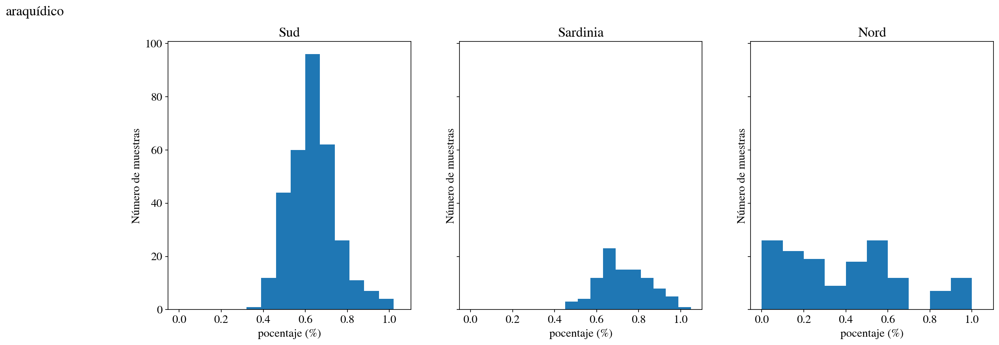

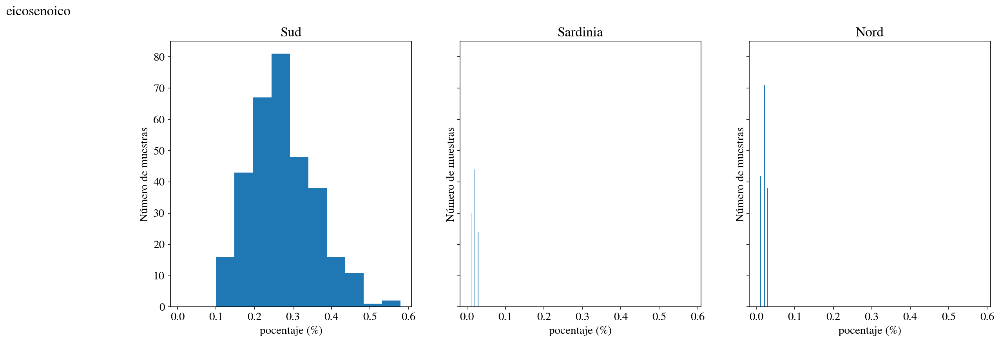

In [40]:
for i, acido in enumerate(acidos):
    fig, axes=plt.subplots(figsize=(18,6), nrows=1, ncols=3, sharey=True, sharex=True)
    fig.suptitle(f'{acido}', x=0)
    for region in range (0,3):    
        df_prov = datos[datos['región'] == region+1]
        axes[region].hist(df_prov[f'{acido}'])
        axes[region].set_title(dict_region[region+1])
        axes[region].set_ylabel(f'Número de muestras')
        axes[region].set_xlabel(f'pocentaje (%)')


Podemos calcular la frecuencia relativa acumulada del ácido graso eicosenoico respecto a un valor determinado (p.ej. 0.05) como la fracción de valores menores a 0.05 respecto al total. Para ello, podemos obtener la serie de condiciones a partir de la columna del ácido graso eicosenoico, lo que nos devolverá una serie de valores de verdad cierto o falso. Si luego sumamos mediante la función `np.sum()` los valores ciertos obtenemos el número total de valores menores que 0.05. Si aplicamos la función `np.mean()` obtenemos el valor deseado de la frecuencia relativa acumulada.

In [41]:
datos['eicosenoico_menor_a_0_05'] = np.where(datos['eicosenoico'] < 0.05, True, False)
datos

,Procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico,eicosenoico_menor_a_0_05
0,Puglia-Nord,1,1,10.75,0.75,2.26,78.23,6.72,0.36,0.60,0.29,False
1,Puglia-Nord,1,1,10.88,0.73,2.24,77.09,7.81,0.31,0.61,0.29,False
2,Puglia-Nord,1,1,9.11,0.54,2.46,81.13,5.49,0.31,0.63,0.29,False
3,Puglia-Nord,1,1,9.66,0.57,2.40,79.52,6.19,0.50,0.78,0.35,False
4,Puglia-Nord,1,1,10.51,0.67,2.59,77.71,6.72,0.50,0.80,0.46,False
...,...,...,...,...,...,...,...,...,...,...,...,...
567,Liguria-Ovest,3,8,12.80,1.10,2.90,74.90,7.90,0.10,0.10,0.02,True
568,Liguria-Ovest,3,8,10.60,1.00,2.70,77.40,8.10,0.10,0.10,0.03,True
569,Liguria-Ovest,3,8,10.10,0.90,2.10,77.20,9.70,0.00,0.00,0.02,True
570,Liguria-Ovest,3,8,9.90,1.20,2.50,77.50,8.70,0.10,0.10,0.02,True


In [42]:
#Cantidad
datos['eicosenoico_menor_a_0_05'].sum()

249

In [43]:
#Frecuencia relativa
#Los valores 'True' suman 1 y los 'False' no suman, entonces en este caso la media se calcula como (249*1+323*0)/572=0.4353146853146853
datos['eicosenoico_menor_a_0_05'].mean()

0.4353146853146853

Con pandas podemos indexar un objeto mediante una condición. Interpreta el siguiente código

In [44]:
bajo=datos[datos[u'eicosenoico'] < 0.02]
pd.crosstab(bajo[u'área'],bajo[u'región'])

región,2,3
área,,
5,19,0
6,11,0
7,0,17
8,0,11
9,0,14


**El resultado muestra que todas las muestras de los olivos de la región 1 tienen un porcentaje relativo de este ácido graso mayor que 0.02%. Esta es la razón por la que la región 1 no aparece en la tabla de contingencia**

Hemos visto que el ácido oleico domina a los demás, lo que dificulta el análisis del resto de ácidos grasos. Eliminaremos el ácido oleico y representaremos los demás de nuevo mediante un diagrama de barras. ¿Qué podemos decir respecto al ácido eicosenoico?

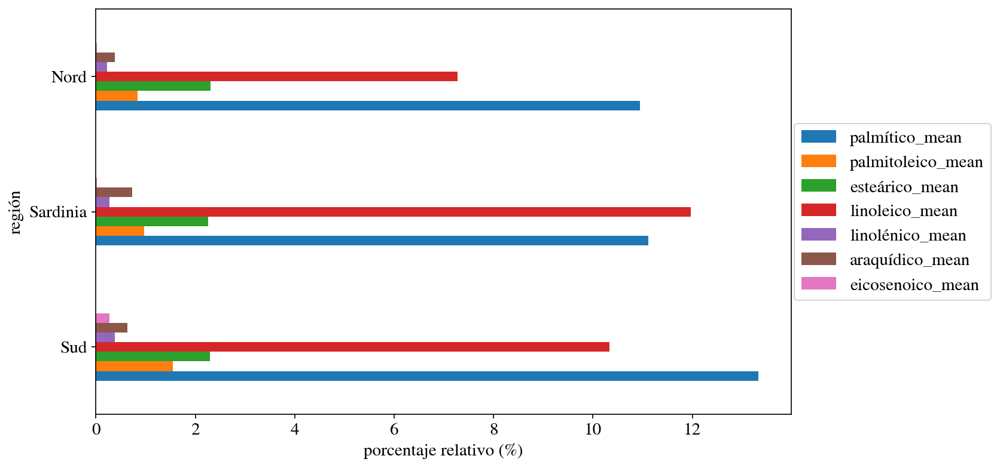

In [45]:
menosoleico=[u'palmítico_mean',u'palmitoleico_mean',u'esteárico_mean',u'linoleico_mean',u'linolénico_mean',u'araquídico_mean',u'eicosenoico_mean']
datos_menosoleico=datos_mean_correcto[menosoleico]

ax = datos_menosoleico.plot(kind = 'barh')
ax.legend(loc='right',bbox_to_anchor=(1.3,0.5))
ax.set_yticklabels(list(dict_region.values()))
ax.set_xlabel('porcentaje relativo (%)')

plt.show()

**El gráfico muestra visualmente, tal como se observó analíticamente anteriormente, que la región 1 (Sud) es la única región que cuenta con olivos en los que se puede detectar presencia se ácido eicosenoico en cantidades no despreciables.**

Representa tres gráficos, uno por cada región, con los diagramas de cajas para cada uno de los ácidos grasos, menos el oleico. ¿Podemos decir algo respecto al ácido linoleico?

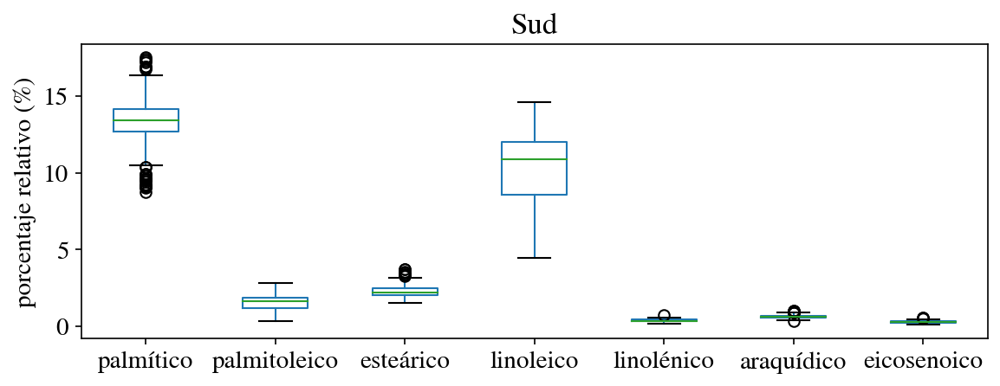

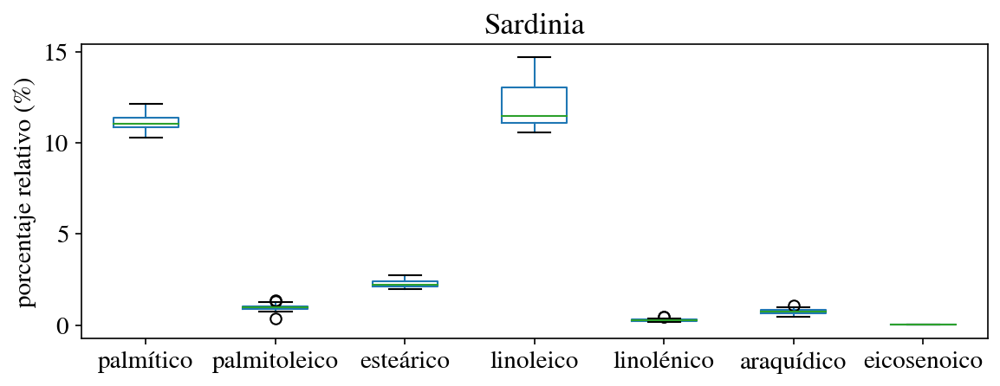

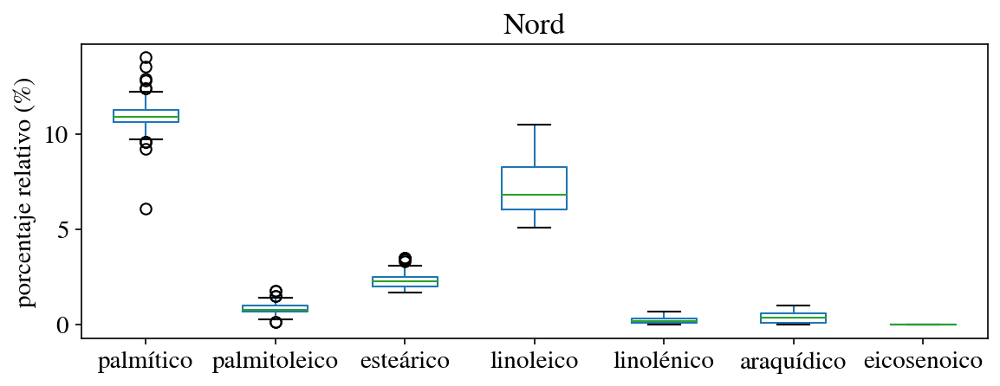

In [46]:
menosoleico=[u'palmítico',u'palmitoleico',u'esteárico',u'linoleico',u'linolénico',u'araquídico',u'eicosenoico']

for clave, group in datos.groupby(u'región'):
        group[menosoleico].plot(kind='box', figsize=(9,3), sharey=True, title=dict_region[clave], ylabel='porcentaje relativo (%)')       

**Se puede decir que el ácido palmítico y el ácido linoleico son los más abundantes (luego del oleico) en las muestras de olivo.**
   
**Adicionalmente, se observa que en los olivos de Sardinia el contenido de ácido linoleico es mayor que en las otras dos regiones y que, además, la dispersión de los datos es menor.**

Representa un diagrama de coordenadas paralelas para los distintos ácidos grasos, mediante la función parallel_coordinates(). Puede ser útil normalizar los datos para que la media sea cero. Juega con distintos valores del parámetro alpha para poder distinguir mejor los distintos haces de valores.

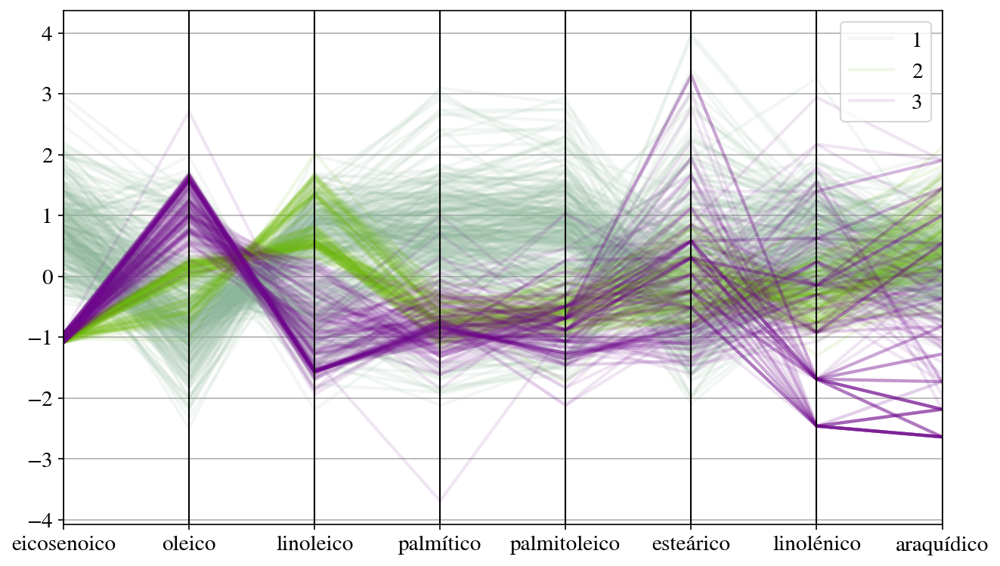

In [47]:
from pandas.plotting import parallel_coordinates
from sklearn.preprocessing import StandardScaler

datos_esc = datos.copy()
scaler = StandardScaler()
datos_esc[acidos] = scaler.fit_transform(datos_esc[acidos])

#se propone un nuevo ordenamiento de los ácidos grasos (se colocan al principio los que se espera que tengan mayor separabilidad)
acidos_ordenados = [u'eicosenoico', u'oleico', u'linoleico', u'palmítico',u'palmitoleico',u'esteárico',u'linolénico',u'araquídico']

#alpha 0.1
parallel_coordinates(datos_esc, 'región', alpha=0.1, cols=acidos_ordenados )
plt.show()

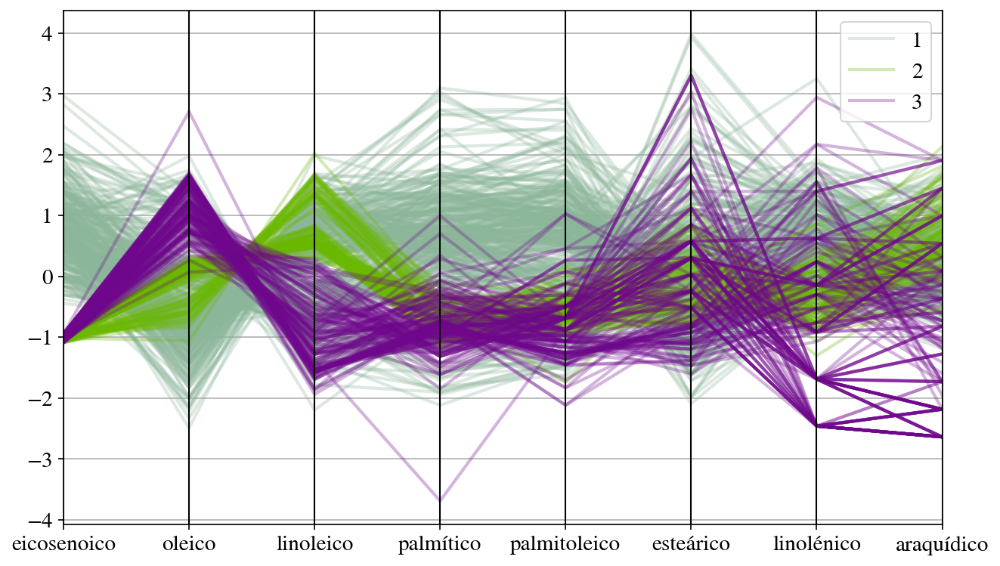

In [48]:
#alpha 0.3
parallel_coordinates(datos_esc, 'región', alpha=0.3, cols=acidos_ordenados )
plt.show()

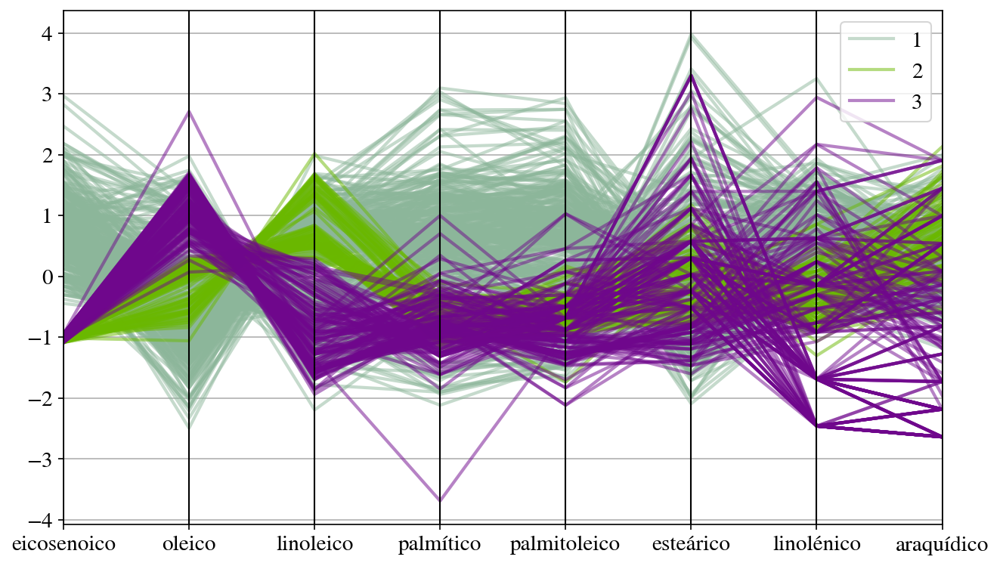

In [49]:
#alpha 0.5
parallel_coordinates(datos_esc, 'región', alpha=0.5, cols=acidos_ordenados )
plt.show()

**Los gráficos de coordenadas paralelas presentados parecen mostrar que el ácido eicosenoico permite separar las muestras de la región 1 del resto y que los ácidos oleico y linoleico permitirían distinguir entre las muestras de la región 2 y las muestras de la región 3. Es decir que utilizando estos 3 ácidos podríamos discriminar las muestras de las 3 regiones.**


Representa un diagrama de dispersión del ácido linoleico frente al araquídico, diferenciando las tres regiones. Este gráfico es útil cuando queremos enfatizar un aspecto visual de los datos en una justificación. ¿Qué podemos decir respecto a la separabilidad de las distintas regiones? 

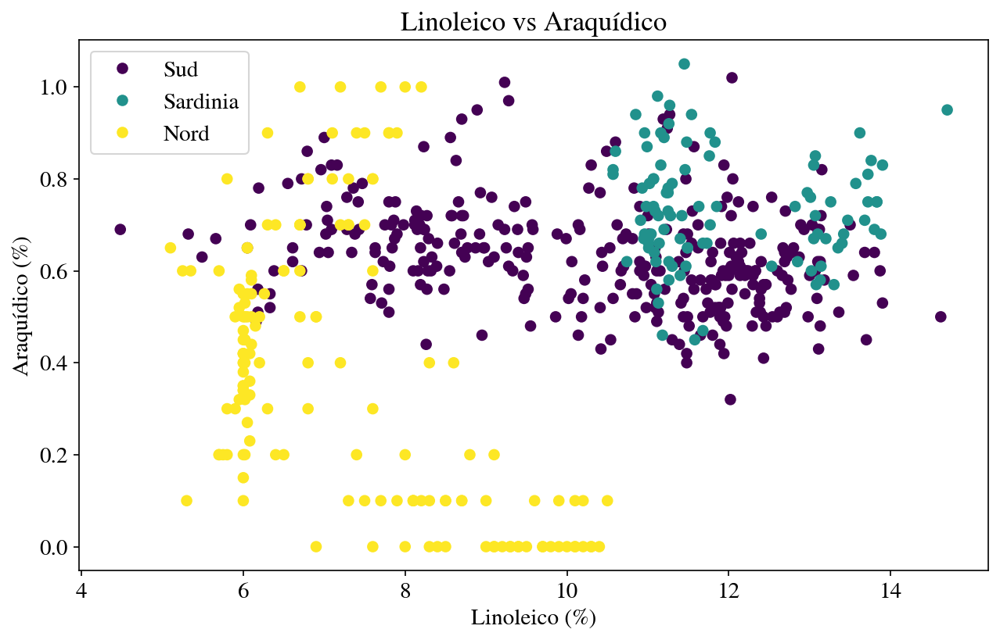

In [50]:
fig=plt.figure()

grafico=plt.scatter(datos['linoleico'], datos['araquídico'], c=datos['región'])

axis = fig.gca()
axis.set_title('Linoleico vs Araquídico')
axis.set_xlabel('Linoleico (%)')
axis.set_ylabel('Araquídico (%)')
axis.legend(grafico.legend_elements()[0], list(dict_region.values()))

plt.show()

**Al observar el gráfico se puede decir que las regiones no son separables al considerar los ácidos araquídico y linoleico, y esto se debe que muestras de distintas regiones se superponen en este espacio de 2 dimensiones.**

Representa mediante diagramas de dispersión los distintos ácidos grasos dos a dos. No es necesario permutar los parámetros en la representación. Indaga sobre la separabilidad observada.

c:\users\lenovo\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


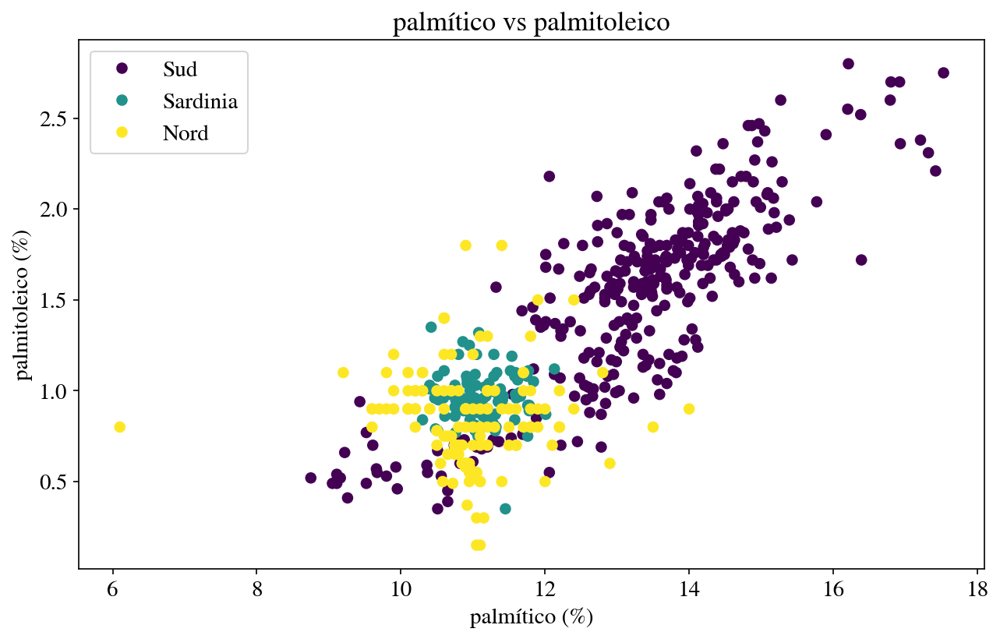

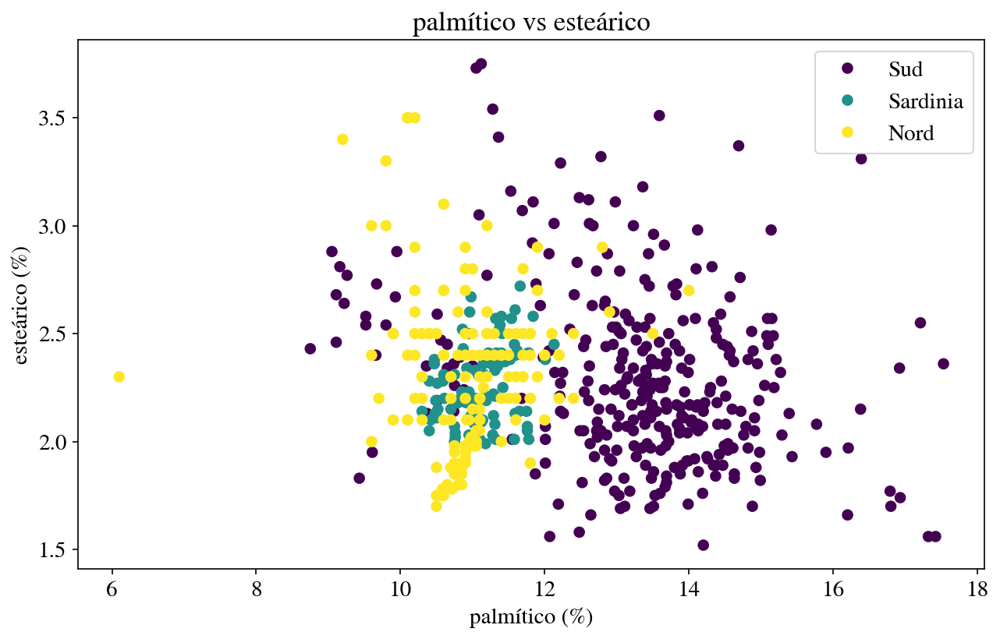

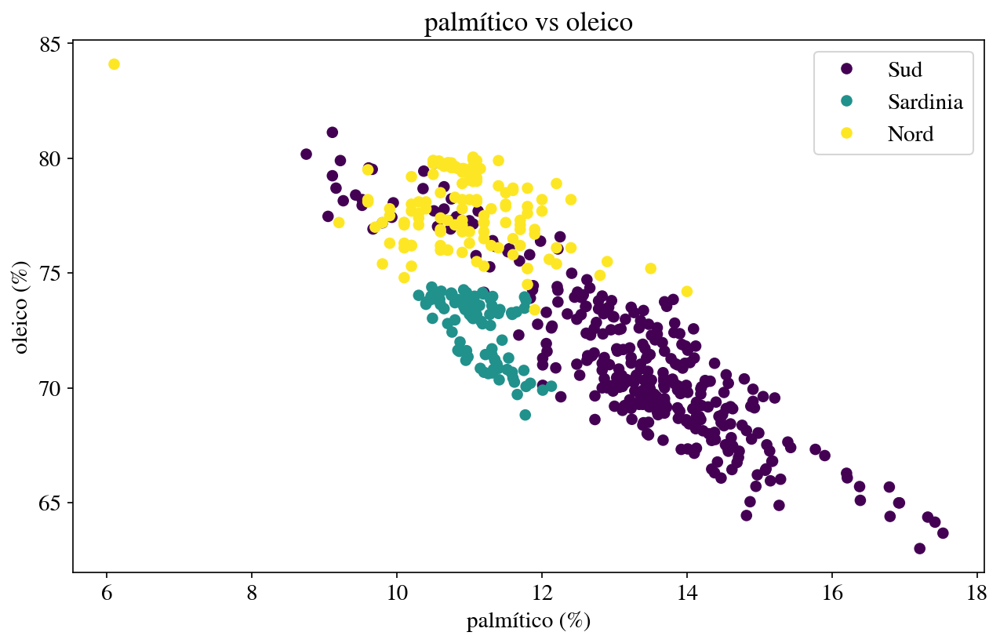

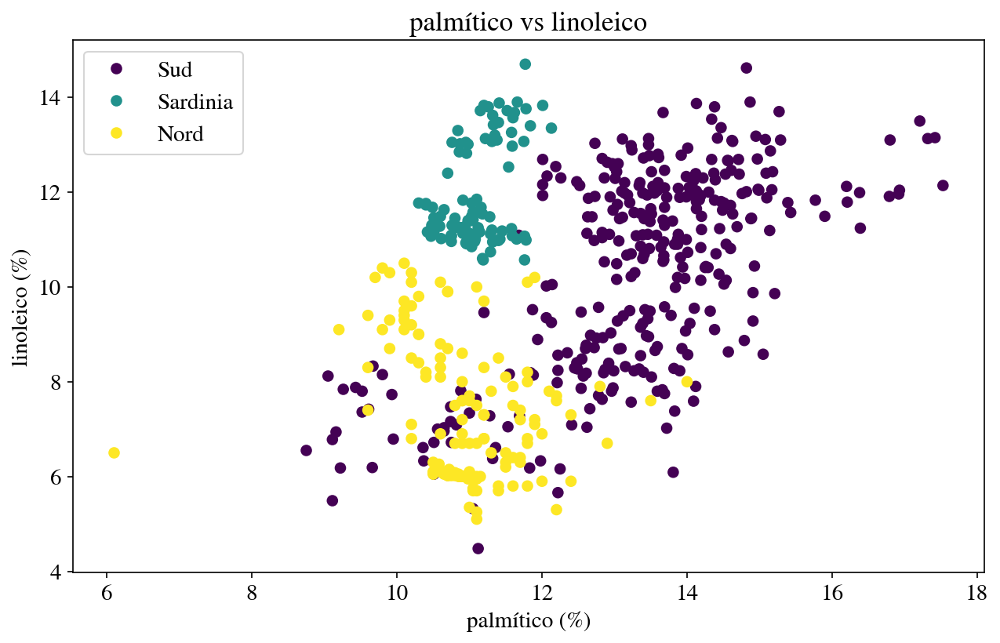

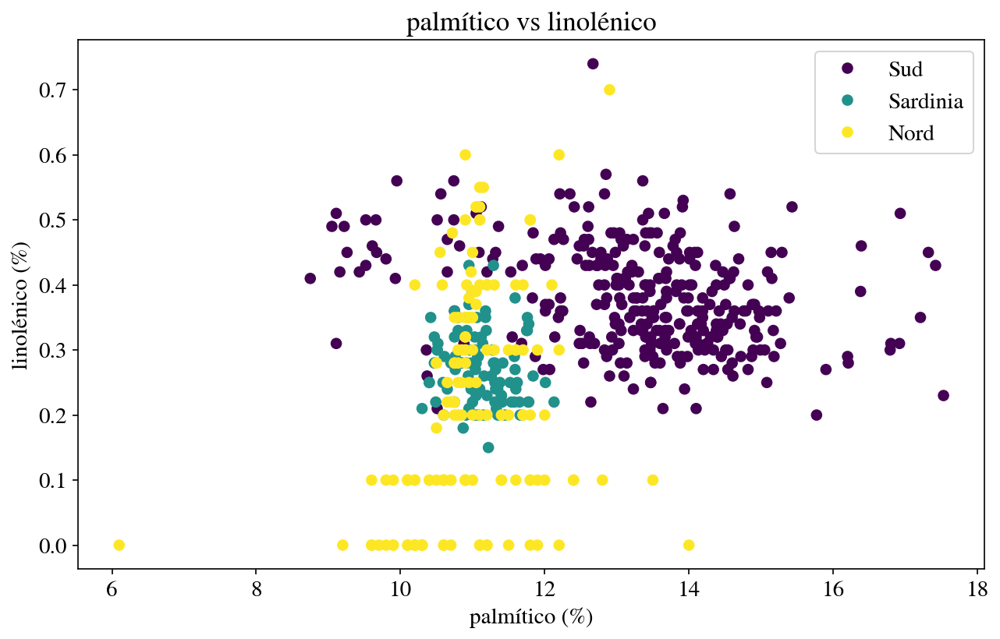

...

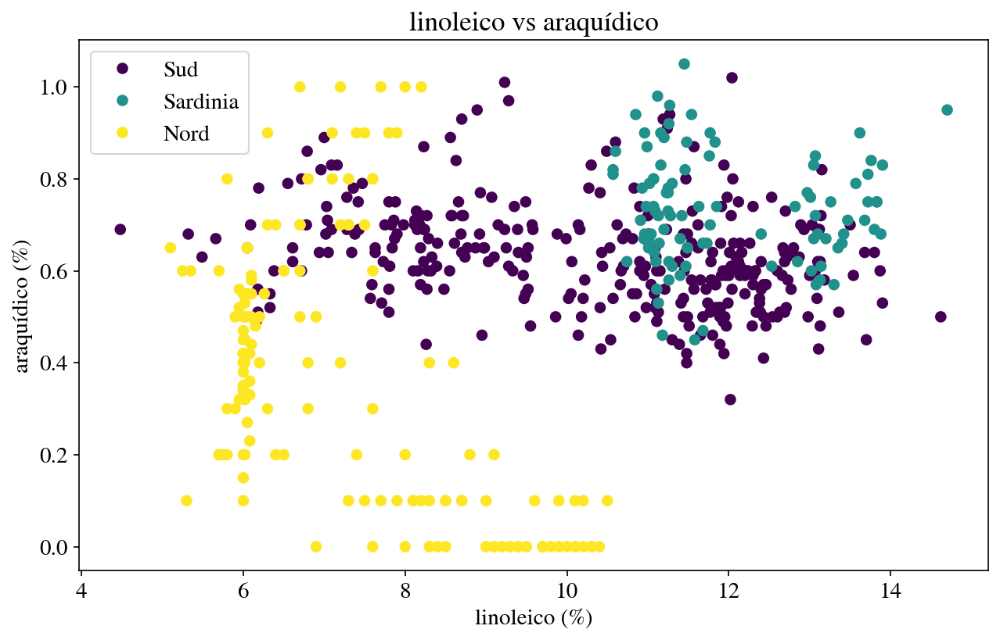

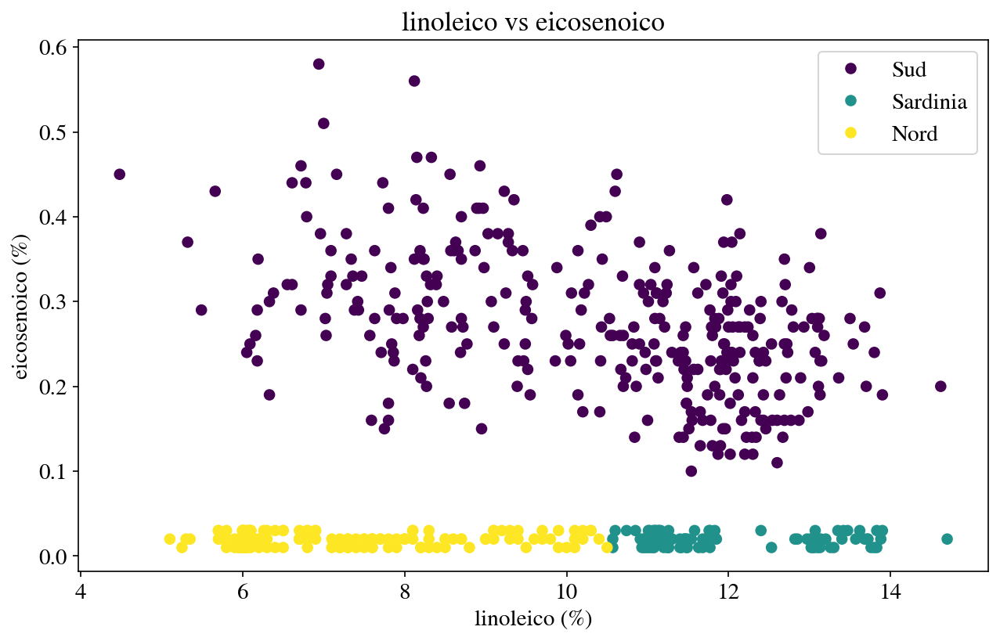

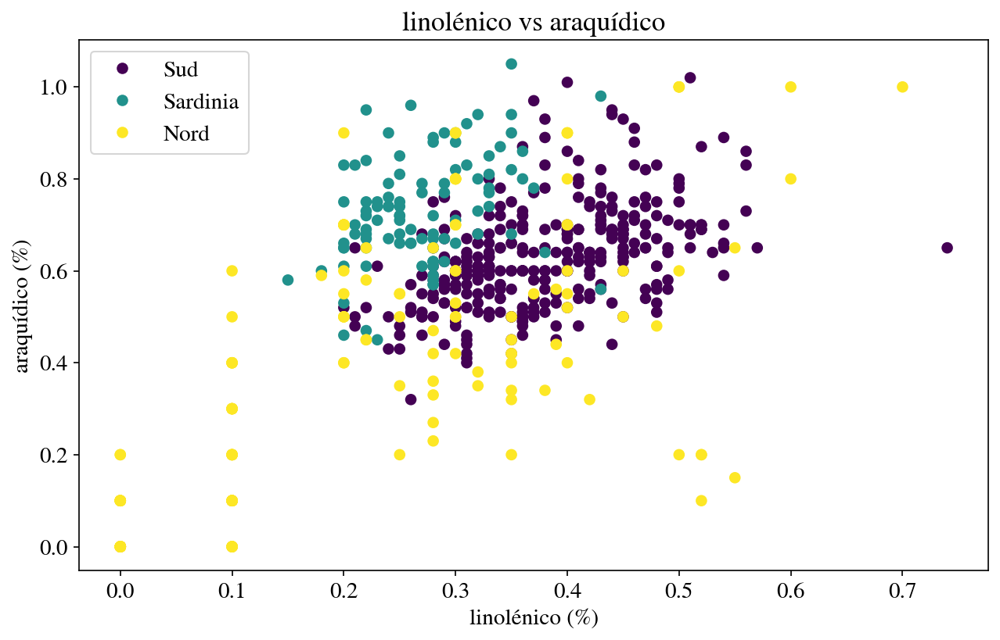

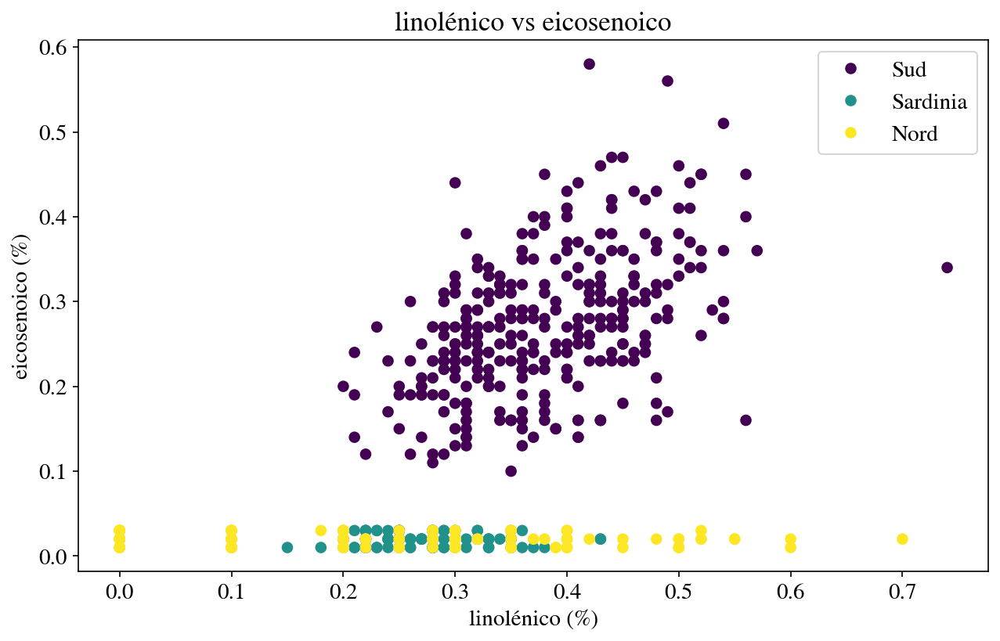

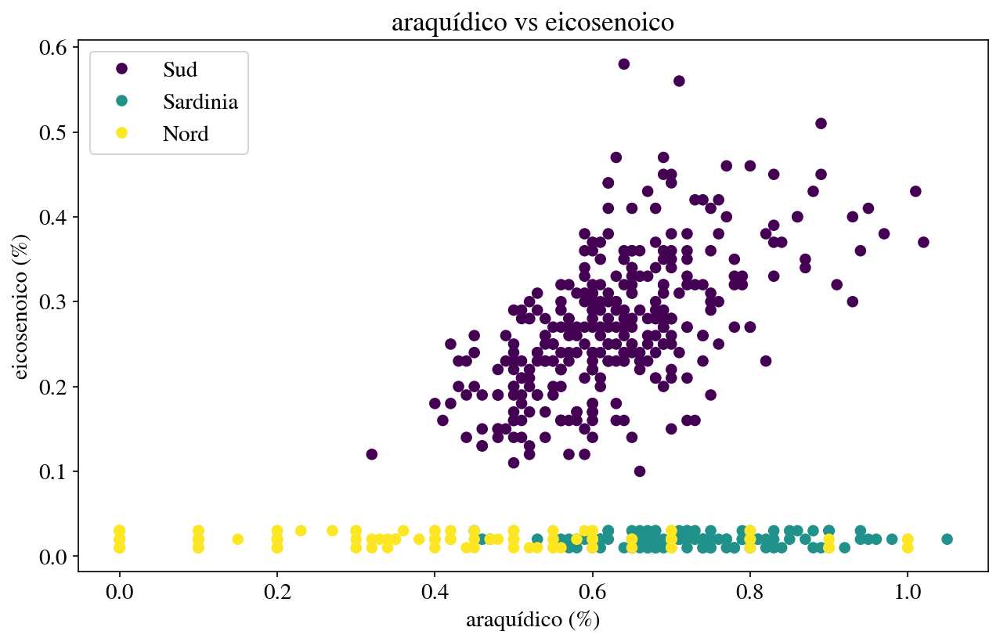

In [51]:
for i, acido in enumerate(acidos):
    if i < len(acidos)-1:
        for a in range (i+1, len(acidos)):
            fig=plt.figure()

            grafico=plt.scatter(datos[acido], datos[acidos[a]], c=datos['región'])

            axis = fig.gca()
            axis.set_title(f'{acido} vs {acidos[a]}')
            axis.set_xlabel(f'{acido} (%)')
            axis.set_ylabel(f'{acidos[a]} (%)')
            axis.legend(grafico.legend_elements()[0], list(dict_region.values()))

        

**Observaciones:**  

*Sardinia*   
Los siguientes pares de ácidos grasos sirven para separar las muestras de la región Sardinia.
- palmitico vs oleico
- palmítico vs linoleico
- palmitoleico vs linoleico
- oleico vs linoleico
Al observar los gráficos, se desprende que las combinaciones (de a 2) de los ácidos oleico, linoleico y palmítico son de utilidad para separar las muestras de esta región.

*Sud*   
Los siguientes pares de ácidos sirven para separar las muestras de la región Sud.
- palmítico vs eicosenoico
- palmitoleico vs eicosenoico
- esteárico vs eicosenoico
- linolénico eicosenoico


*Todas*   
- oleico vs eicosenoico
- linoleico vs eicosenoico

Se desprende que el ácido eicosenoico por sí solo es de utilidad para separar las muestras de la región Sud. Al observar los gráficos, basta con hacer una línea imaginaria en esta dimensión para distinguirlas entre el resto.

**Conclusión:**   

**Tal y como se vio en los gráficos de coordenadas paralelas, en estos gráficos de dispersión se puede ver que los ácidos eicosenoico, oleico y linoleico son suficientes para separar las muestras de las distintas regiones.**

Hasta aquí hemos realizado un análisis de los distintos aceites según su región de procedencia. Podríamos extender el trabajo a las distintas áreas de procedencia, analizando igualmente la separabilidad. ¿Qué podríamos concluir?

c:\users\lenovo\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


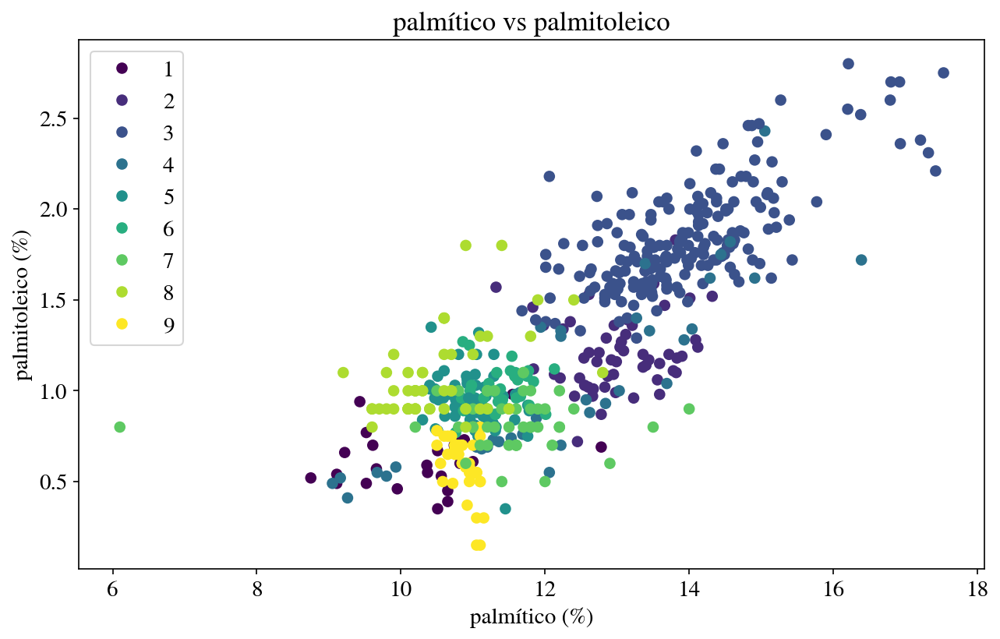

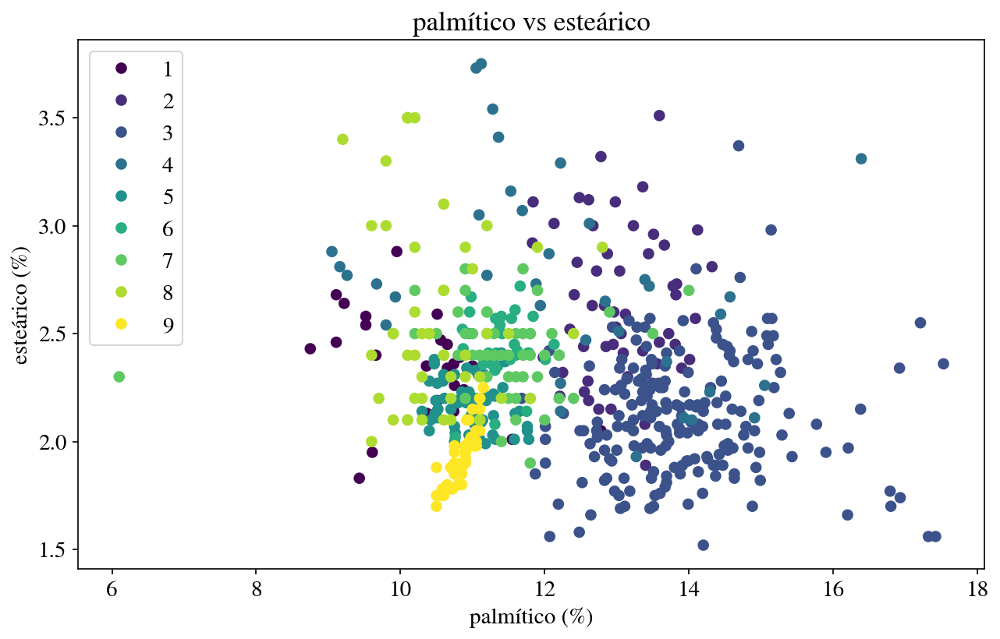

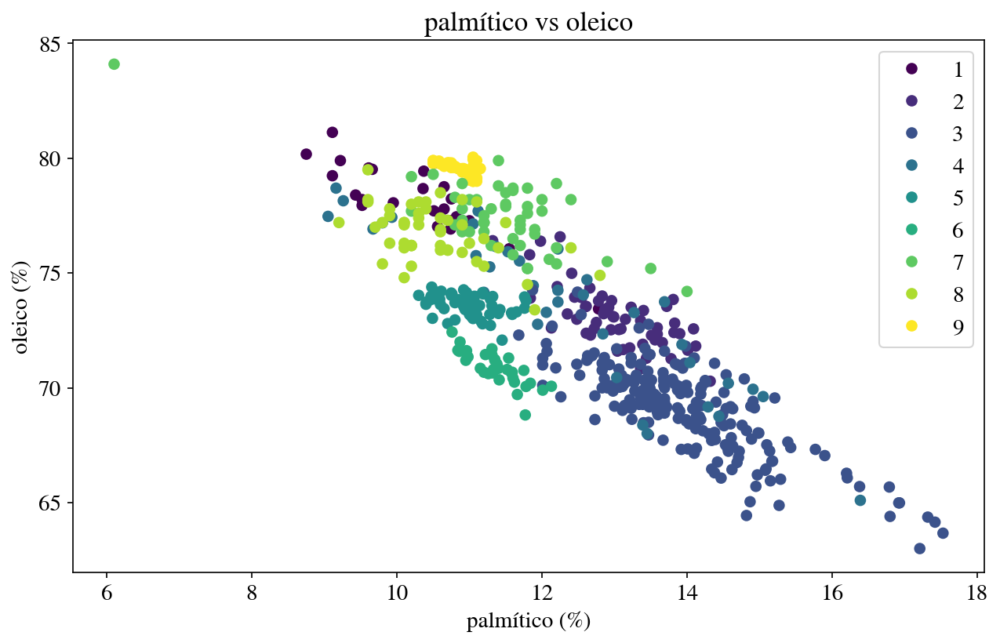

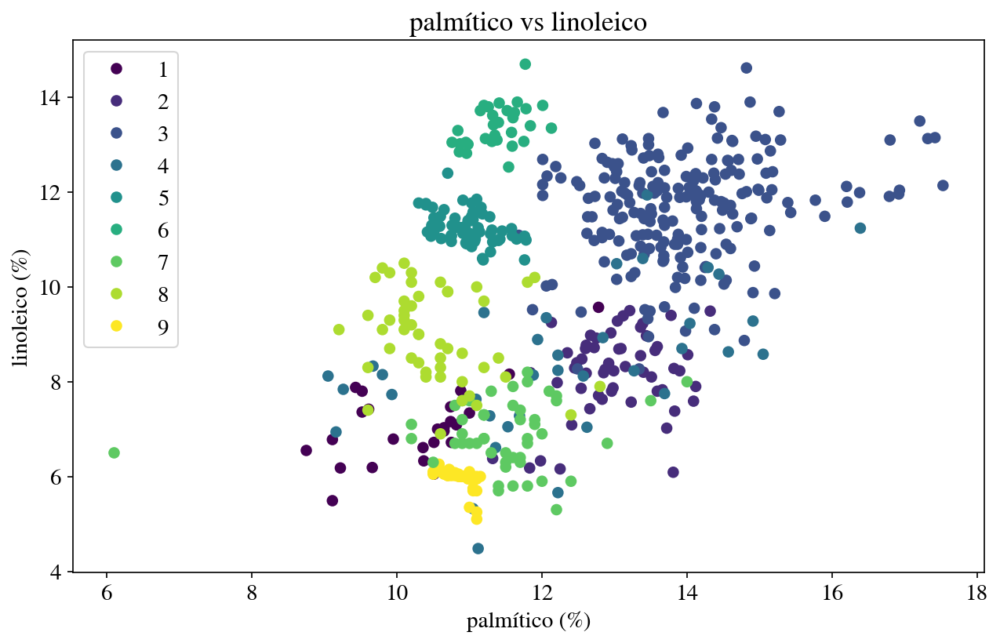

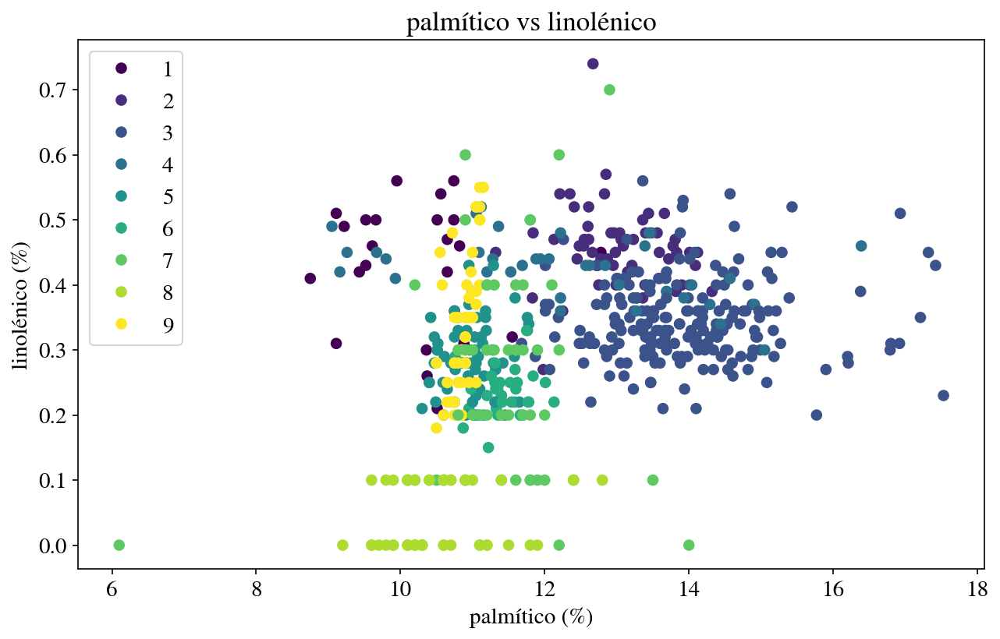

...

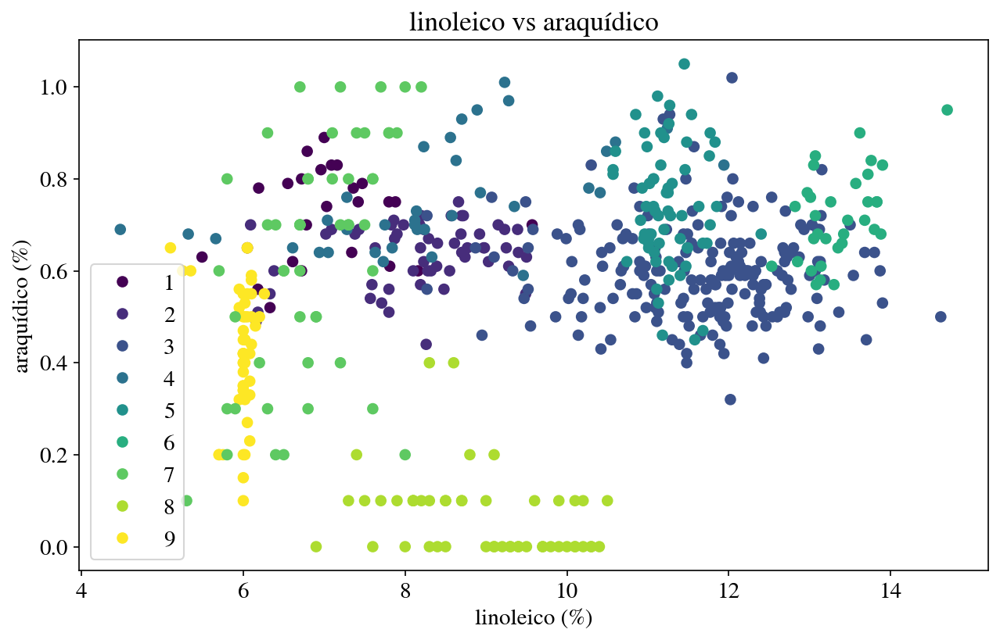

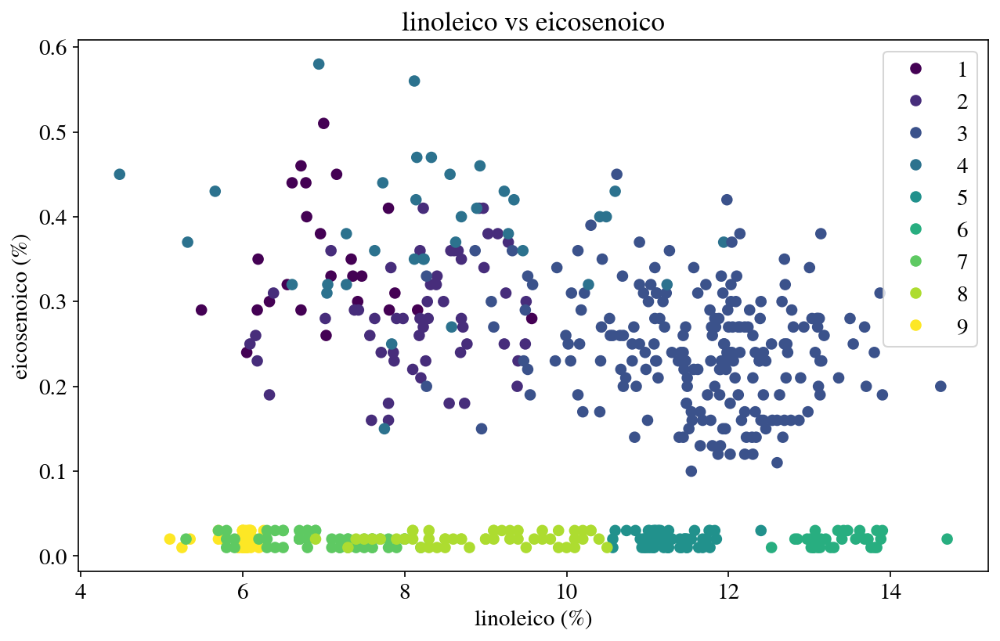

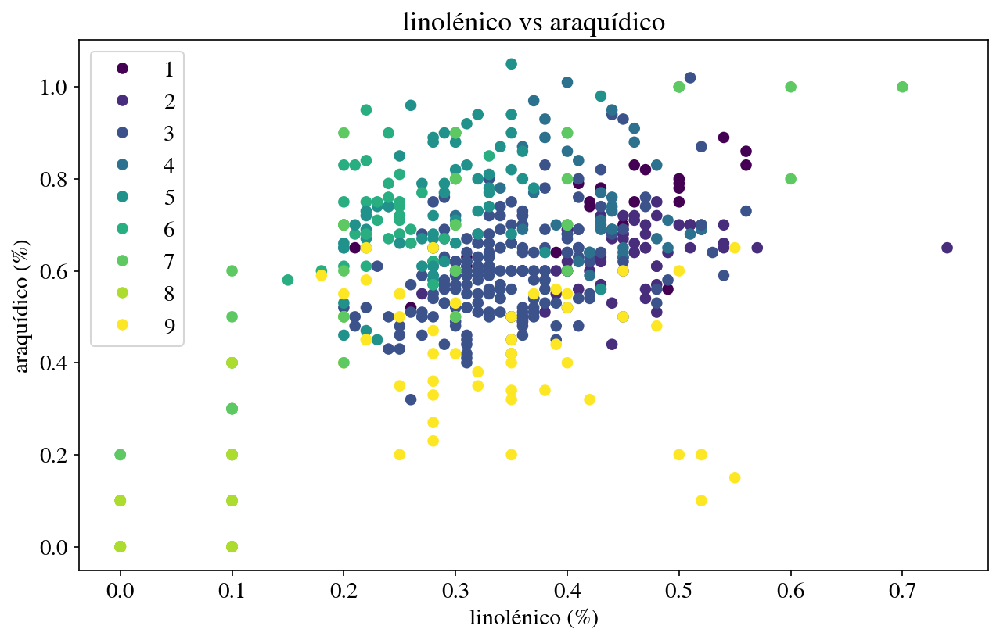

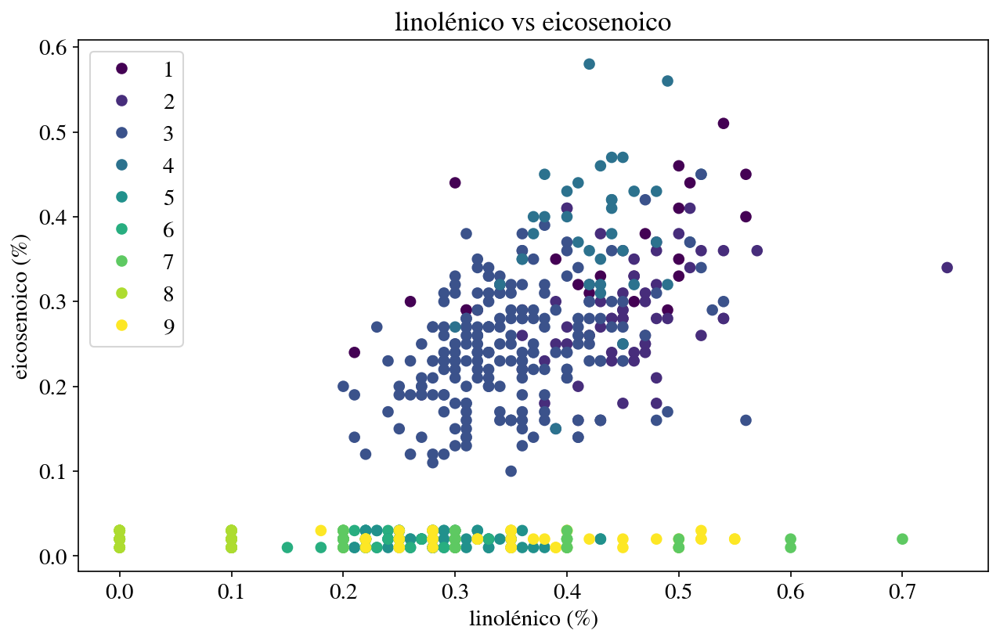

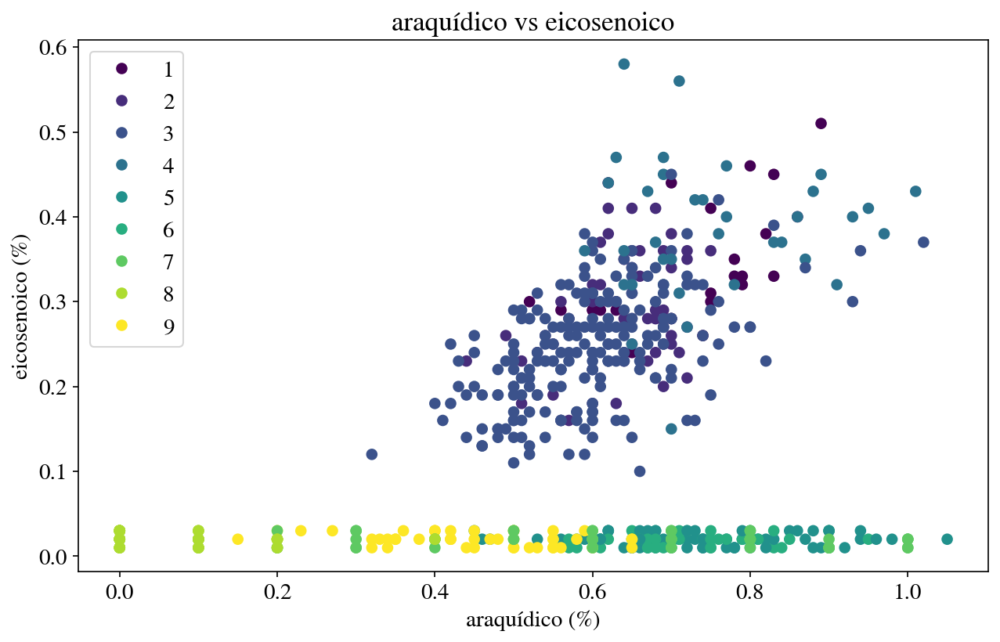

In [52]:
for i, acido in enumerate(acidos):
    if i < len(acidos)-1:
        for a in range (i+1, len(acidos)):
            fig=plt.figure()

            grafico=plt.scatter(datos[acido], datos[acidos[a]], c=datos['área'])

            axis = fig.gca()
            axis.set_title(f'{acido} vs {acidos[a]}')
            axis.set_xlabel(f'{acido} (%)')
            axis.set_ylabel(f'{acidos[a]} (%)')
            axis.legend(grafico.legend_elements()[0], [1,2,3,4,5,6,7,8,9])

**Podríamos concluir que:**   
- el ácido linoleico permite separar las muestras de las áreas 5 y 6 (alrededor del valor 12.5%)
- los ácidos linoleico y linolénico permiten separar las muestras del área 8
- las muestras de las distintas áreas de la región Sud parecen no ser fácilmente separables
    